<a href="https://colab.research.google.com/github/skl30misha/data-science-portfolio/blob/main/classification/product_return_classification/customer_returns_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Descriptions project**




Note: This project is based on synthetic, fictional data created exclusively for educational and training purposes. It does not use real customer information and contains no confidential business data.

Project Goal: The objective of this project is to build a classification model that predicts whether a product will be returned (Yes/No). It simulates a real-world business scenario and follows a complete Data Science pipeline:

Summary (Descriptive) Analytics: Analyze return behavior by product category, customer age, country, discount level, and more.

Diagnostic Analytics: Use statistical tests (t-test, ANOVA, correlation analysis, chi-square) to understand patterns and root causes of returns.

Predictive Analytics: Train machine learning models (e.g., Random Forest, XGBoost) to predict the likelihood of product returns.

Prescriptive Analytics: Generate actionable business recommendations to reduce returns and improve customer satisfaction.

A/B Testing (simulated): Evaluate hypotheses or strategic changes (e.g., discounts, ad channels) and their impact on returns.

This project demonstrates a full end-to-end Data Science workflow, including data extraction, cleaning, visualization, feature engineering, modeling, and interpretation — designed to support data-driven decision-making in marketing, logistics, and customer analytics.


#Import Libraries

In [53]:

from xgboost import XGBClassifier
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.ensemble import  RandomForestRegressor,ExtraTreesRegressor, BaggingRegressor
from scipy.stats import skew, kurtosis
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, ElasticNetCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split


# Data Extraction and Merging

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/customer_returns_classification')

Mounted at /content/drive


In [3]:
df_customers = pd.read_excel("customers.xlsx")
df_sales = pd.read_excel("sales.xlsx")
print(df_customers.head(), "\n")
print(df_sales.head())
print(df_sales.shape)
print(df_customers)
df_customers.info()
df_sales.info()
#clean Data Aalysis
print(df_customers.isnull().sum())
print(df_sales.isnull().sum())
merged_df = pd.merge(df_customers, df_sales, on='order_id', how='inner')
print(merged_df.info())
merged_df['return_reason'] = merged_df['return_reason'].replace('', np.nan)
merged_df['return_reason'] = merged_df['return_reason'].fillna('no_return')
merged_df.isnull().sum()
print(merged_df['return_reason'])
merged_df["order_date"] = pd.to_datetime(merged_df["order_date"])
merged_df["order_day"] = merged_df["order_date"].dt.day_name()
merged_df["order_month"] = merged_df["order_date"].dt.month_name()
merged_df["year"] = merged_df["order_date"].dt.year


   customer_id  order_id  customer_age purchase_frequency  returned  \
0            1     12697            20           One-time         0   
1            2     15984            37              Loyal         1   
2            3      8039            69           Frequent         0   
3            4     12529            26           Frequent         0   
4            5     12992            46           One-time         0   

   days_between_orders  customer_country customer_city       customer_name  \
0                   51  Northern Ireland        London  Cassandra Clark MD   
1                  199           England        Dundee     Alexander Young   
2                   21             Wales     Newcastle         Rachel Holt   
3                   32           England     Edinburgh    Stephanie Palmer   
4                   87  Northern Ireland     Sheffield  Michelle Hernandez   

     payment_method order_time loyalty_segment return_reason  
0         Apple Pay    Evening         Re

#  Summary Statistics

In [32]:

print(merged_df.head())
print(merged_df.tail())
print(merged_df.info())
print(merged_df.describe)
print(merged_df.shape)
print(merged_df.nunique())
print(merged_df.columns)
print("Variance:", merged_df["returned"].var())
print("Min:", merged_df["returned"].min())
print("Max:", merged_df["returned"].max())
print("Mode:", merged_df["returned"].mode()[0])
print("Standard Deviation:", merged_df["returned"].std())
print("Count (returned == Returned):", merged_df[merged_df["returned"] == 1].shape[0])
print("Count (returned == Non Returned):", merged_df[merged_df["returned"] == 0].shape[0])
print("Average (mean):", merged_df["returned"].mean())
print(merged_df.groupby("customer_country")["returned"].mean())
print(merged_df.groupby("category")["returned"].mean())
print(merged_df[merged_df["returned"] == 1].groupby("customer_id")["returned"].count().sort_values(ascending=False).head(30))
print(merged_df['category'].mode())
print(merged_df['product_name'].mode())








   customer_id  order_id  customer_age purchase_frequency  returned  \
0            1     12697            20           One-time         0   
1            2     15984            37              Loyal         1   
2            3      8039            69           Frequent         0   
3            4     12529            26           Frequent         0   
4            5     12992            46           One-time         0   

   days_between_orders  customer_country customer_city       customer_name  \
0                   51  Northern Ireland        London  Cassandra Clark MD   
1                  199           England        Dundee     Alexander Young   
2                   21             Wales     Newcastle         Rachel Holt   
3                   32           England     Edinburgh    Stephanie Palmer   
4                   87  Northern Ireland     Sheffield  Michelle Hernandez   

     payment_method  ... age_group lost_revenue price_category  \
0         Apple Pay  ...       <25    

#  Descriptive  Analytics

This section explores customer return patterns using summary statistics and visualizations.  
It covers trends by age, time, location, discount, and product category — providing insights to support business decisions and prepare for deeper diagnostic and predictive analysis.


            category  total_orders  total_returns  return_rate_percent
0    Beauty & Health          4059            455            11.209658
1           Clothing          4048            414            10.227273
2        Electronics          3938            428            10.868461
3     Home & Kitchen          4122            474            11.499272
4  Sports & Outdoors          4008            402            10.029940


<ipython-input-25-7afb828b77d2>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=catigorical_stats, x='category', y='return_rate_percent', palette='Blues_d')


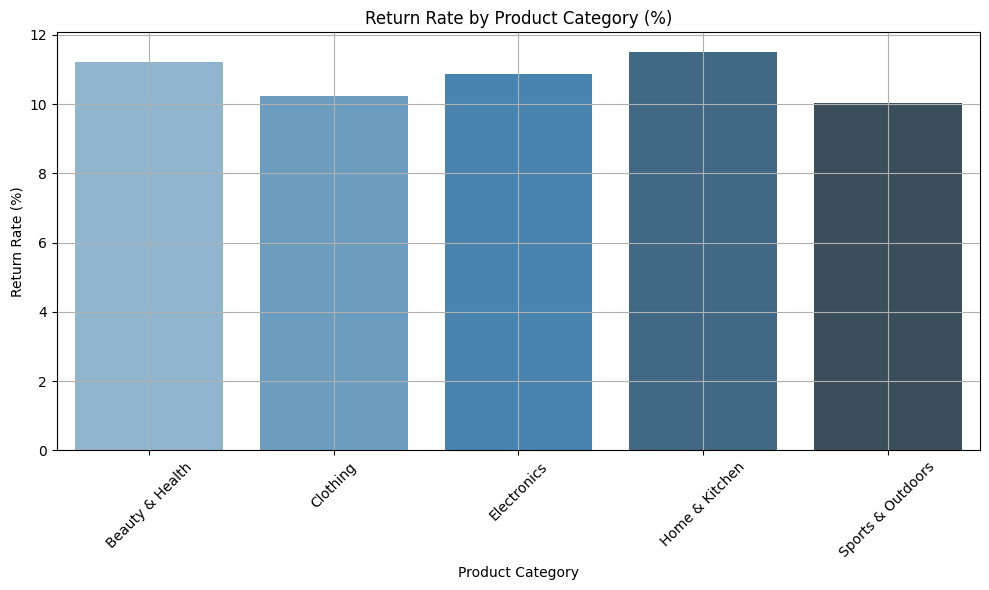

<ipython-input-25-7afb828b77d2>:28: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


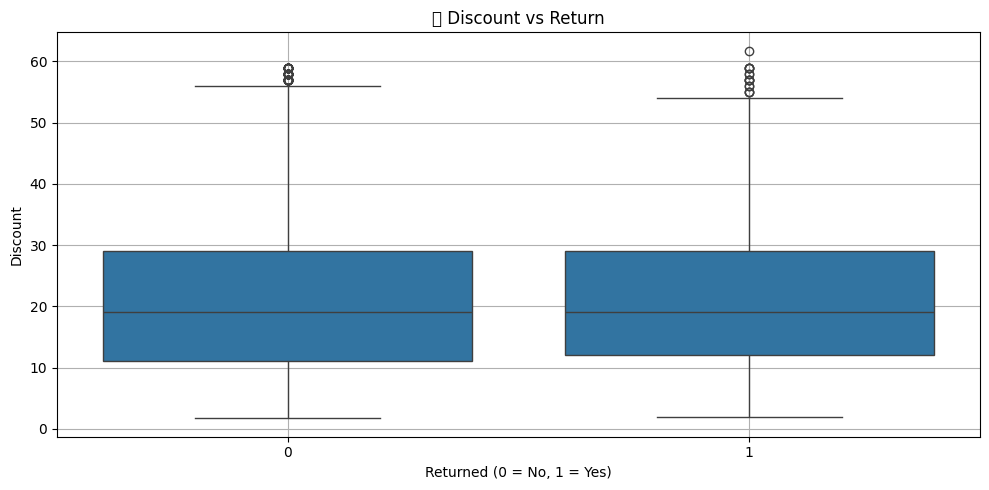

<ipython-input-25-7afb828b77d2>:34: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=merged_df, x='returned', y='discount', estimator='mean', ci='sd')


               mean  median  count
returned                          
0         21.370107    19.0  18002
1         21.372729    19.0   2173


<ipython-input-25-7afb828b77d2>:39: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


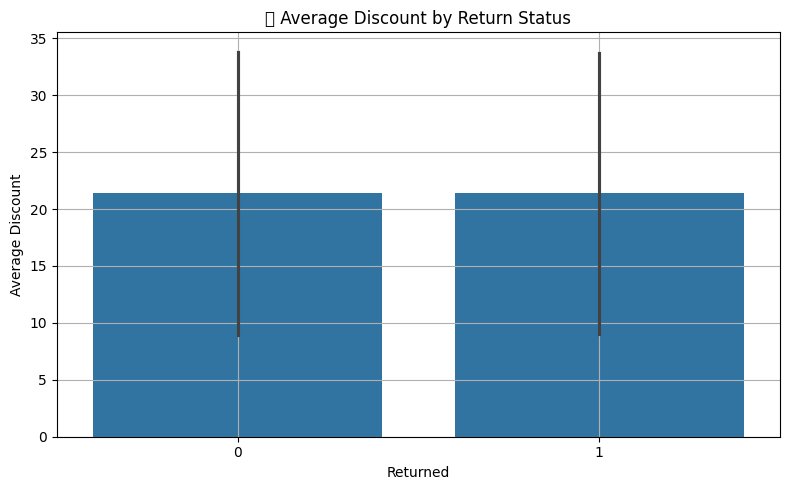

<ipython-input-25-7afb828b77d2>:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=traffic_stats, x="traffic_source", y="return_rate", palette="Reds")


   traffic_source  total_orders  total_returns  return_rate
0      Banner Ads           387             44        11.37
1          Direct          1919            219        11.41
2  Email Campaign           561             59        10.52
3    Facebook Ads          3856            420        10.89
4      Google Ads          7754            848        10.94
5    LinkedIn Ads           413             32         7.75
6  Organic Search          2808            297        10.58
7        Referral           990             96         9.70
8      TikTok Ads           577             60        10.40
9     YouTube Ads           910             98        10.77


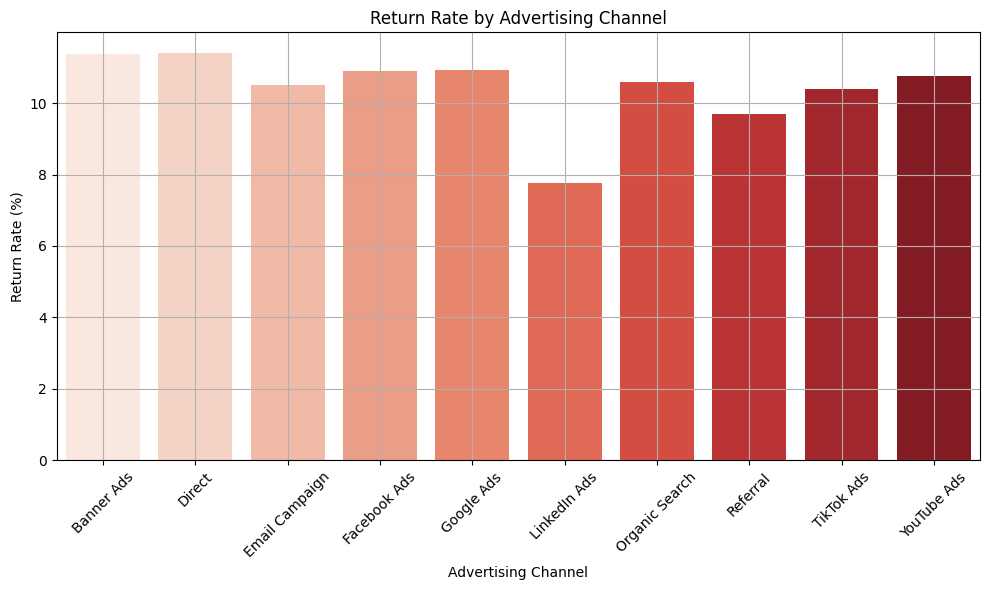

<ipython-input-25-7afb828b77d2>:72: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_stats = merged_df.groupby("age_group").agg(
<ipython-input-25-7afb828b77d2>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=age_stats, x="age_group", y="return_rate", palette="coolwarm")


  age_group  total_orders  total_returns  return_rate
0       <25          3077            338        10.98
1     25-34          3830            459        11.98
2     35-44          3903            395        10.12
3     45-54          3942            432        10.96
4     55-64          3928            402        10.23
5       65+          1495            147         9.83


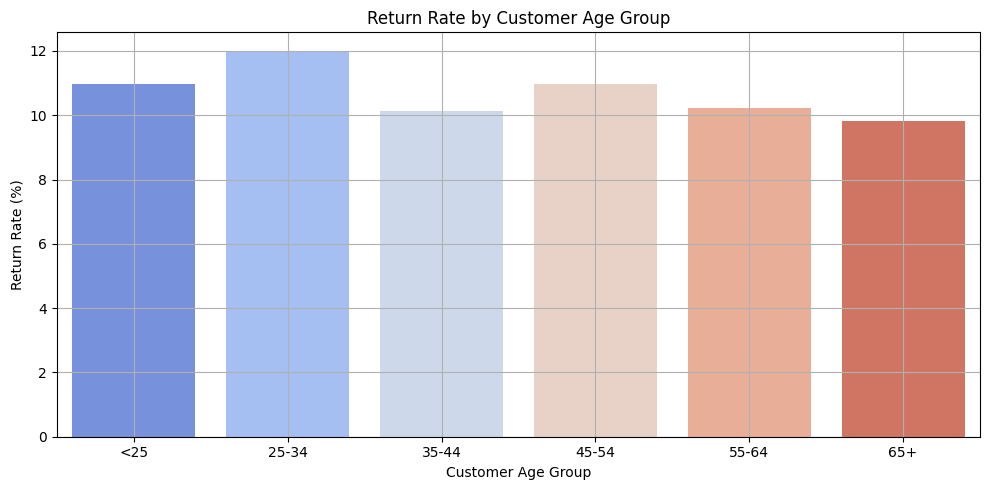

  loyalty_segment  total_orders  total_returns  return_rate
0             New         10053           1074        10.68
1         Regular          8092            884        10.92
2             VIP          2030            215        10.59


<ipython-input-25-7afb828b77d2>:103: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=loyalty_stats, x="loyalty_segment", y="return_rate", palette="YlOrRd")


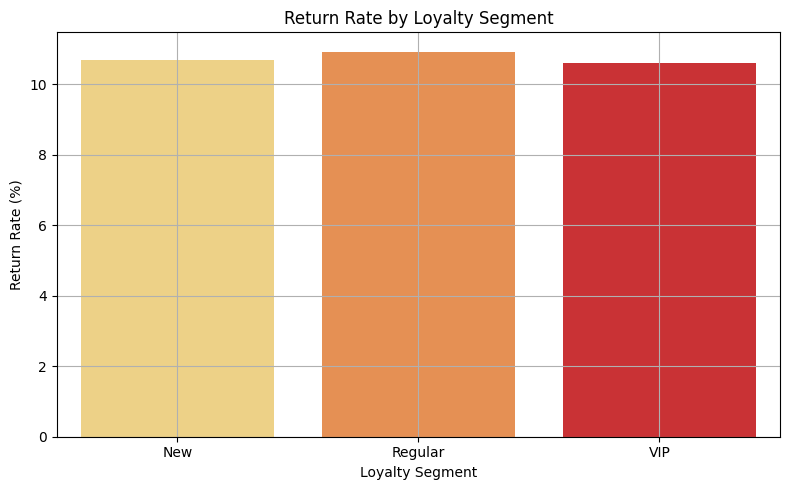

   customer_country  total_orders  total_returns  return_rate
0           England          5022            556    11.071286
1  Northern Ireland          4956            515    10.391445
2          Scotland          5103            547    10.719185
3             Wales          5094            555    10.895171


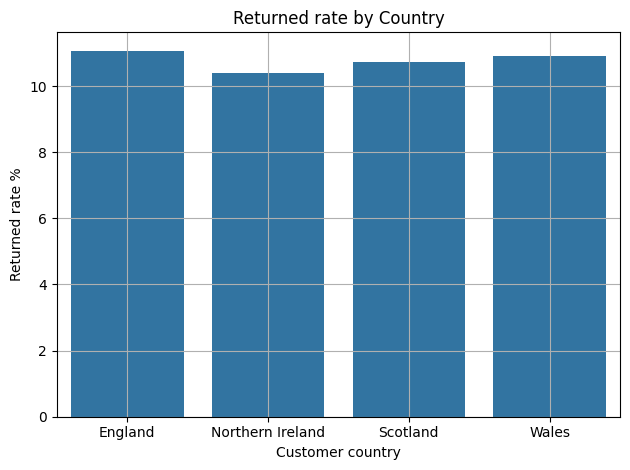

<ipython-input-25-7afb828b77d2>:133: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=merged_df, x="returned", y="shipping_cost", palette="Set2")
<ipython-input-25-7afb828b77d2>:138: UserWarning: Glyph 128666 (\N{DELIVERY TRUCK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128666 (\N{DELIVERY TRUCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


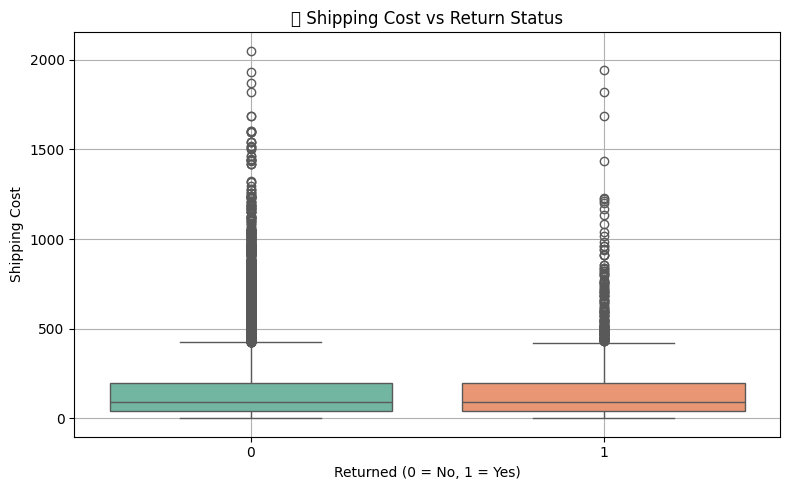

<ipython-input-25-7afb828b77d2>:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=merged_df, x="returned", y="ad_spend", palette="coolwarm")
<ipython-input-25-7afb828b77d2>:150: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


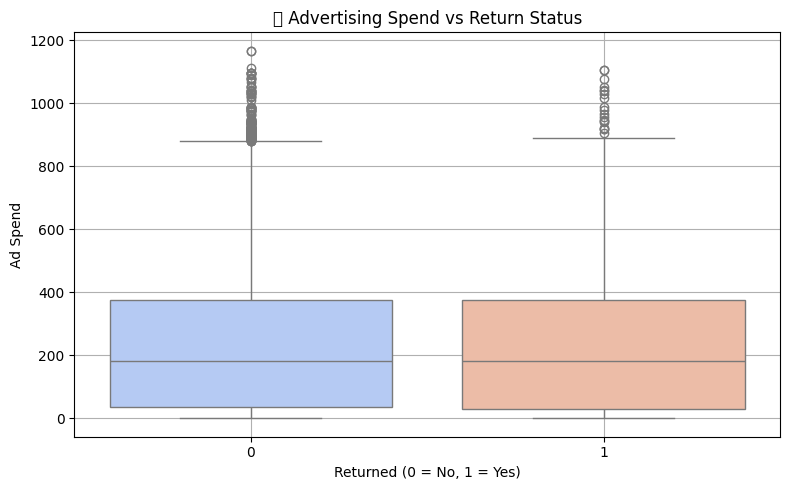

     payment_method  total_revenue  total_returned  return_rate
0         Apple Pay           4095             449    10.964591
1  Cash on Delivery           4013             440    10.964366
2       Credit Card           4040             419    10.371287
3        Google Pay           3962             421    10.625946
4            PayPal           4065             444    10.922509


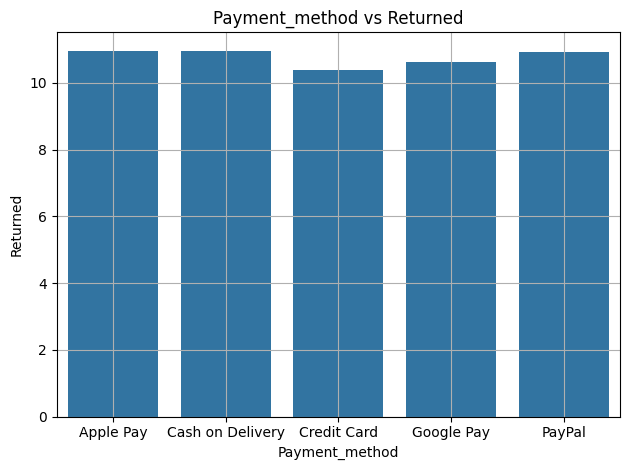

       customer_id  total_orders  total_returns  return_rate
3434          3435             6              5         0.83
13137        13138             6              5         0.83
15440        15441             5              4         0.80
19024        19025             4              4         1.00
16441        16442             6              4         0.67
8115          8116             6              4         0.67
11963        11964             5              4         0.80
9119          9120             6              4         0.67
17553        17554             5              4         0.80
19730        19731             5              4         0.80


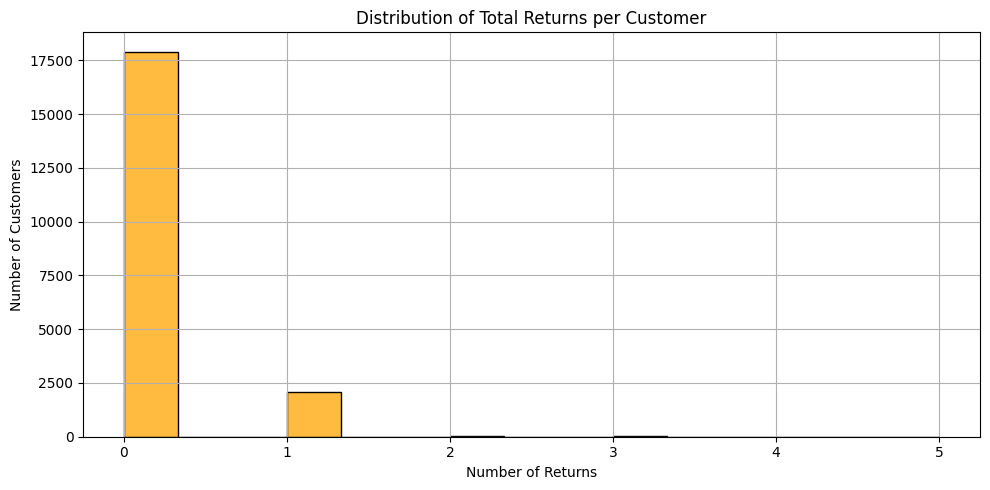

<ipython-input-25-7afb828b77d2>:197: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  revenue_loss["lost_revenue"] = revenue_loss["price"] * revenue_loss["quantity"]


💸 Total Revenue Lost Due to Returns: £25,682,710.53


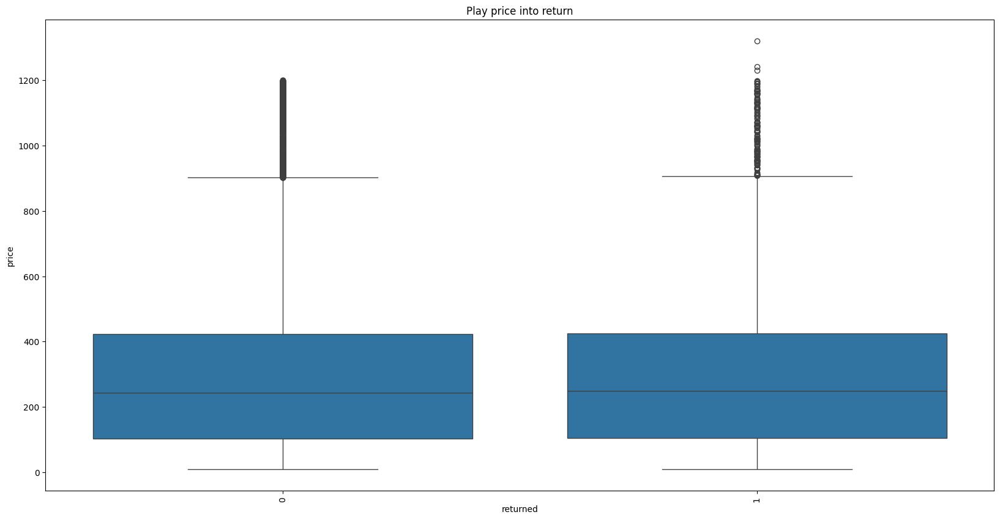

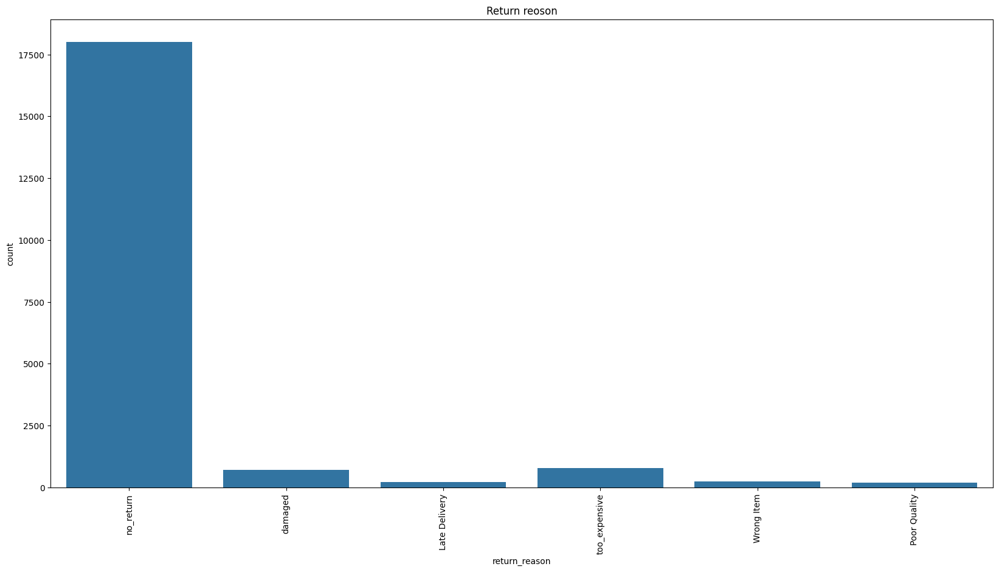

<ipython-input-25-7afb828b77d2>:231: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=lost_revenue_by_category, x='category', y='lost_revenue', palette='Reds_r')
<ipython-input-25-7afb828b77d2>:237: UserWarning: Glyph 128184 (\N{MONEY WITH WINGS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128184 (\N{MONEY WITH WINGS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


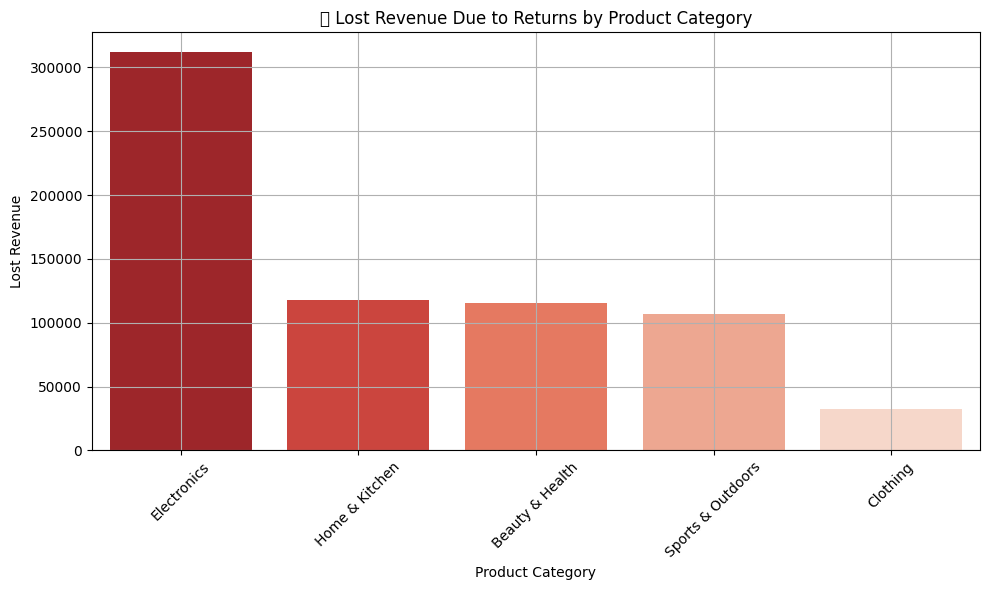

   return_reason  count
0      no_return  18020
1  too_expensive    777
2        damaged    721
3     Wrong Item    240
4  Late Delivery    214
5   Poor Quality    203


<ipython-input-25-7afb828b77d2>:247: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=return_reosen_stats, x="count", y="return_reason", palette="mako")


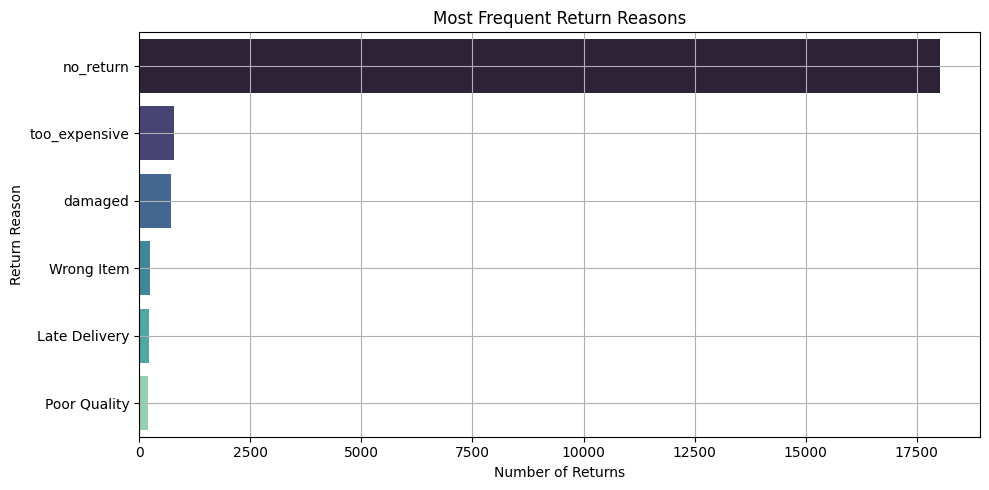

   return_reason  count
0  too_expensive    777
1        damaged    721
2     Wrong Item    240
3  Late Delivery    214
4   Poor Quality    203


<ipython-input-25-7afb828b77d2>:259: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=return_reosen_stats, x="count", y="return_reason", palette="mako")


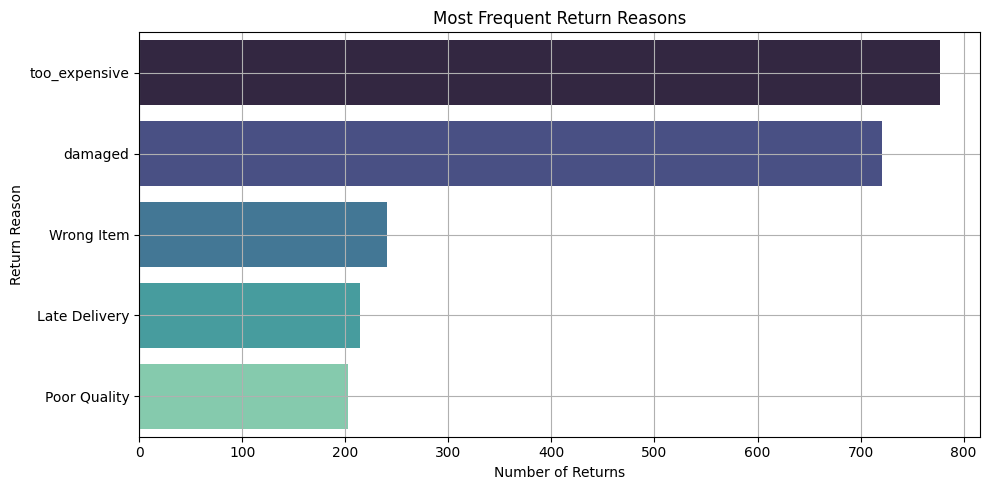

   traffic_source  returned_count   ROI_mean  bounce_rate_mean  order_count  \
0      Banner Ads             387  34.022222         51.576624          387   
1          Direct            1919  36.125680         49.277020         1919   
2  Email Campaign             561  43.326257         47.049614          561   
3    Facebook Ads            3856  38.102324         51.492423         3856   
4      Google Ads            7754  43.605270         49.849652         7754   
5    LinkedIn Ads             413  26.834649         49.512868          413   
6  Organic Search            2808  44.702614         50.099465         2808   
7        Referral             990  27.822859         49.800606          990   
8      TikTok Ads             577  37.732565         49.303813          577   
9     YouTube Ads             910  45.039571         52.670408          910   

   total_revenue_sum  most_common_returned  
0            2032663                     0  
1           10226744                    

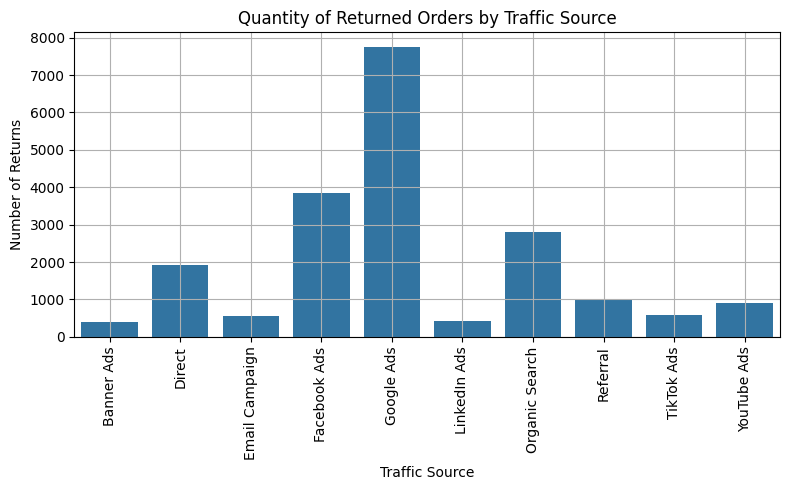

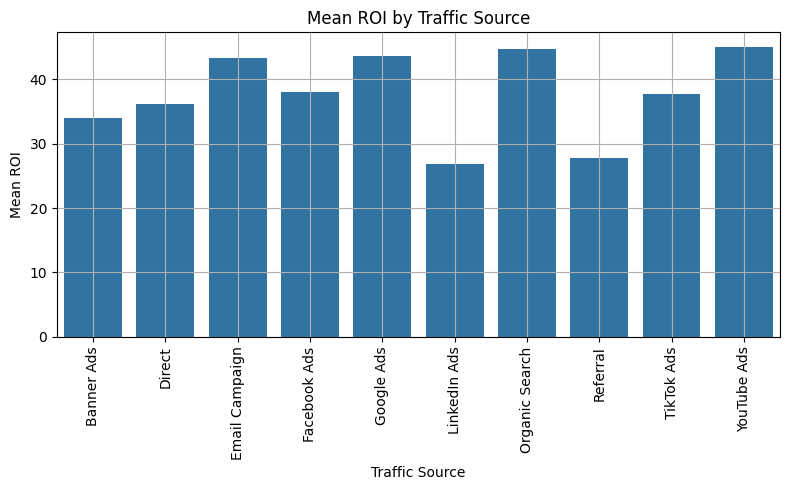

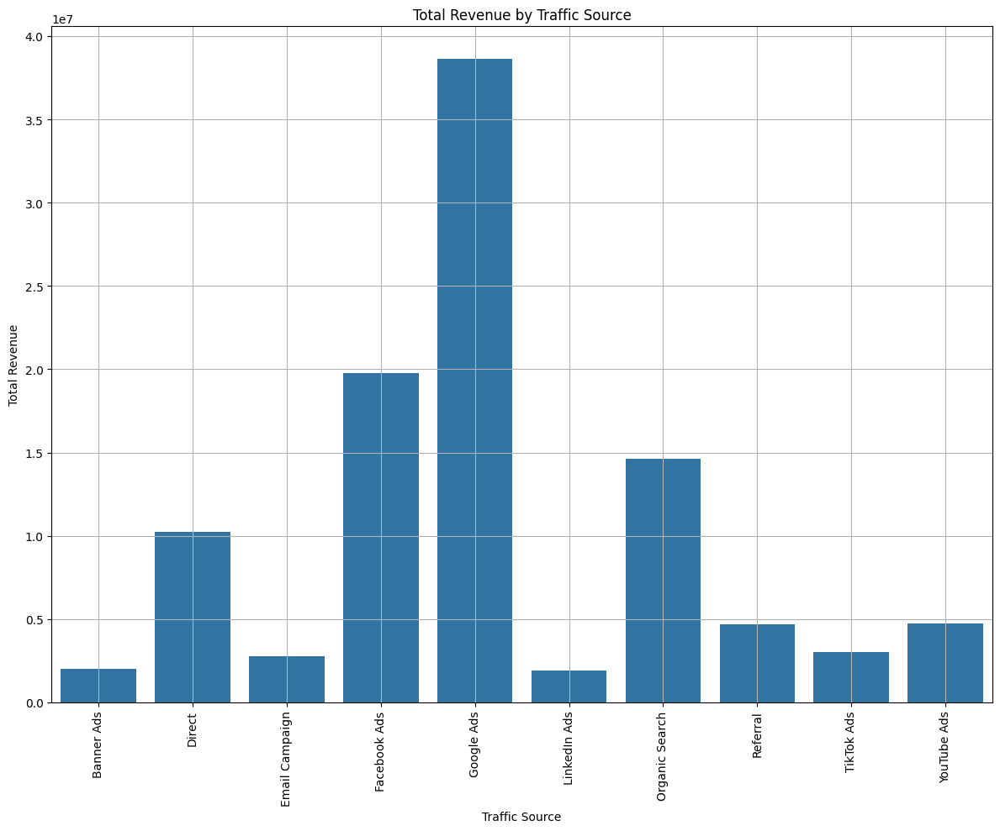

   customer_country  returned_count returned_mode    avg_age
0           England            5022     no_return  43.572083
1  Northern Ireland            4956     no_return  43.589185
2          Scotland            5103     no_return  43.357633
3             Wales            5094     no_return  43.636631


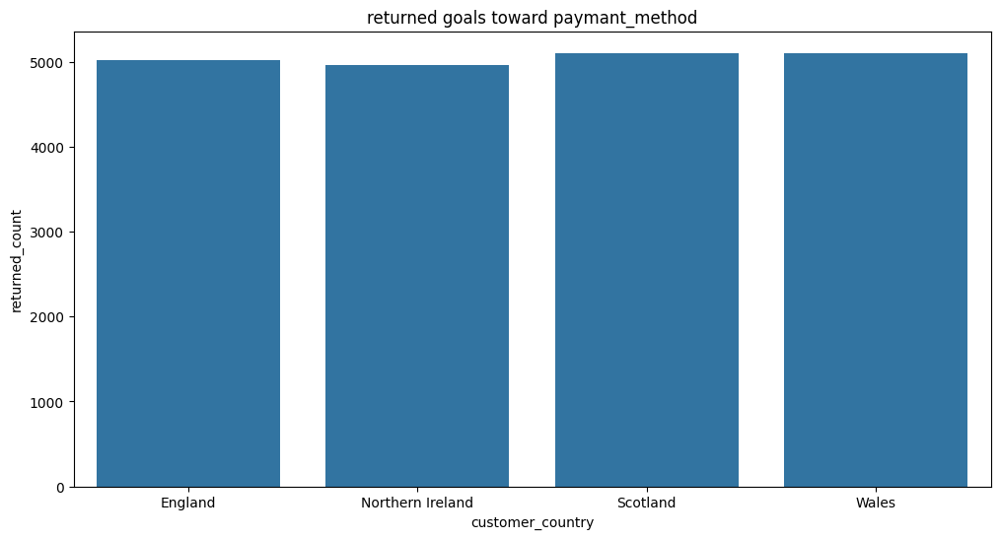

customer_country  England  Northern Ireland  Scotland  Wales
return_reason                                               
Late Delivery          50                43        58     63
Poor Quality           58                59        42     44
Wrong Item             57                59        55     69
damaged               193               164       181    183
no_return            4471              4445      4559   4545
too_expensive         193               186       208    190


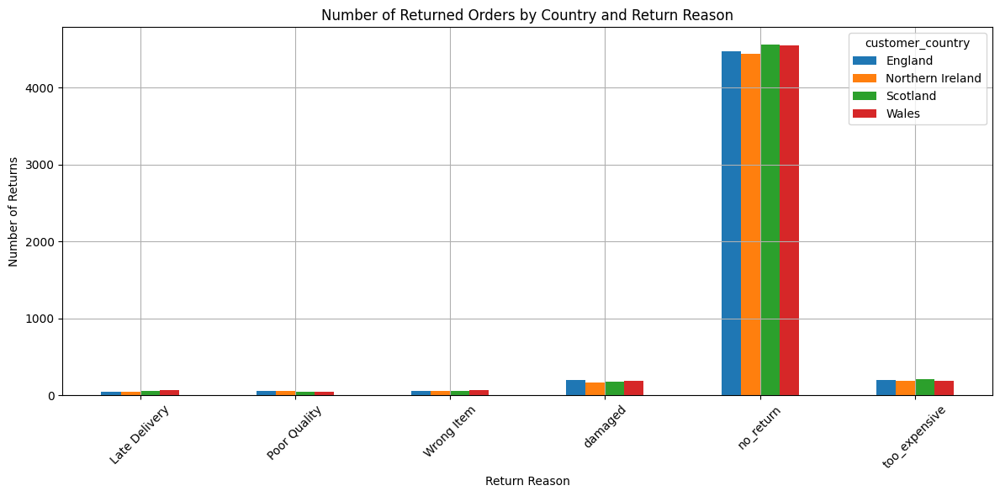

<ipython-input-25-7afb828b77d2>:351: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


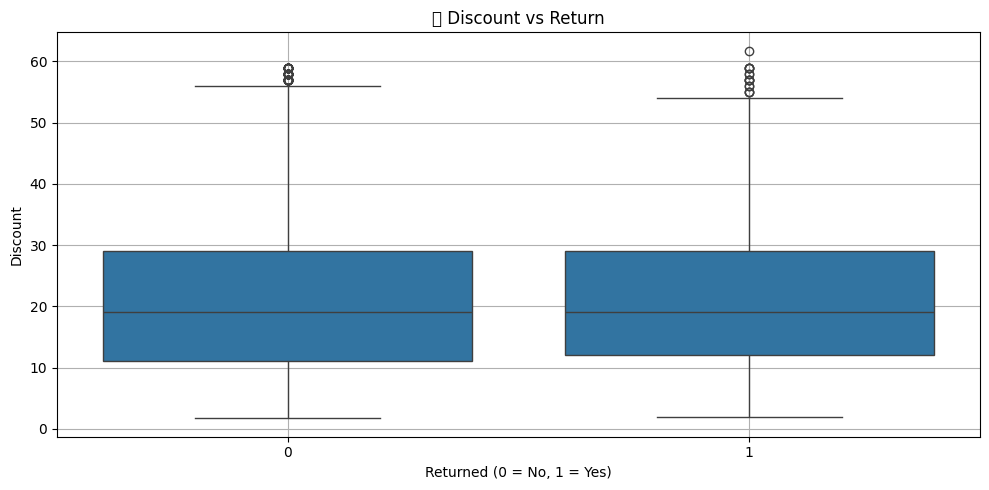

<ipython-input-25-7afb828b77d2>:357: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=merged_df, x='returned', y='discount', estimator='mean', ci='sd')


               mean  median  count
returned                          
0         21.370107    19.0  18002
1         21.372729    19.0   2173


<ipython-input-25-7afb828b77d2>:362: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


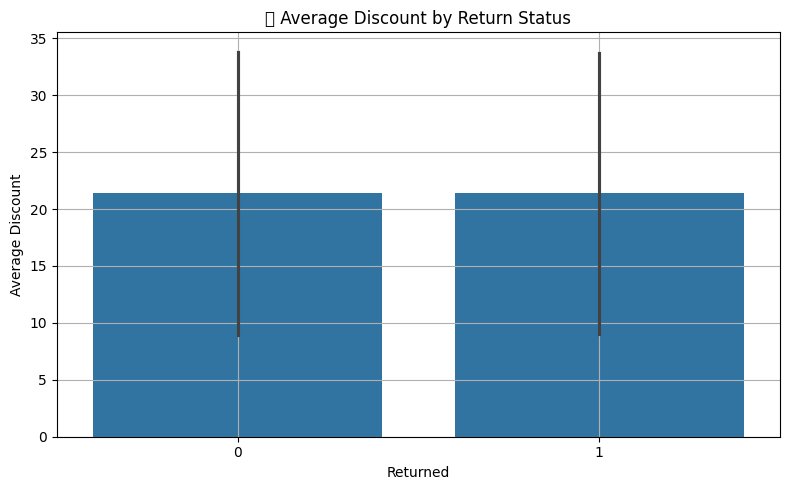

<ipython-input-25-7afb828b77d2>:375: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_price_discount = pd.pivot_table(
<ipython-input-25-7afb828b77d2>:467: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


                   discount
cheap             21.517776
medium            21.577679
expensive         21.120544
premium           21.321113
New               21.422533
Regular           21.305832
VIP               21.369507
England           21.465082
Northern Ireland  21.344401
Scotland          21.336130
Wales             21.336641
   order_day  total_orders  total_returns  total_revenue  avg_order_value  \
0     Friday          2894            316       14990738          5179.94   
1     Monday          3006            341       15236449          5068.68   
2   Saturday          2783            294       14323943          5146.94   
3     Sunday          2827            306       14063216          4974.61   
4   Thursday          2798            285       13939987          4982.13   
5    Tuesday          2976            321       15567871          5231.14   
6  Wednesday          2891            310       14251543          4929.62   

   return_rate  lost_revenue  
0        10.92  

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


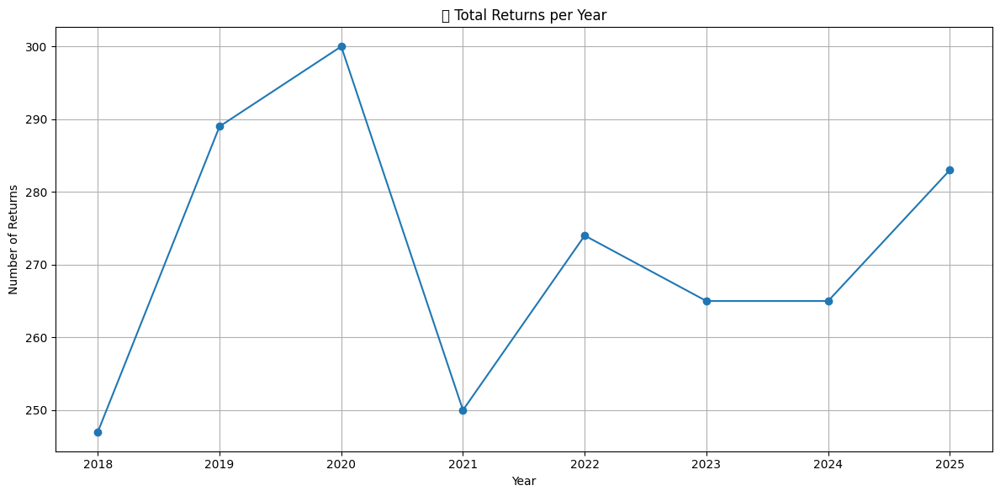

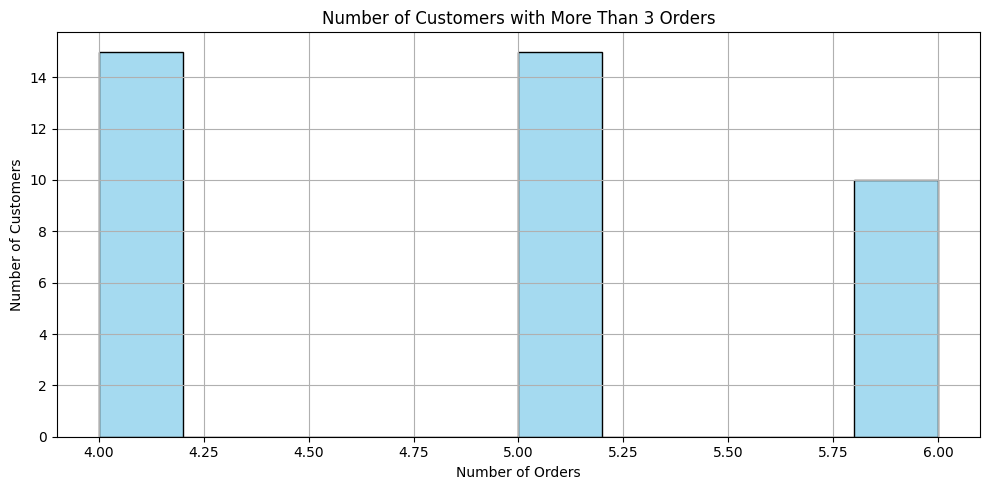

In [25]:
# Which product categories have the highest return rates?
catigorical_stats = merged_df.groupby("category").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum"),
).reset_index()
catigorical_stats["return_rate_percent"] = catigorical_stats["total_returns"] / catigorical_stats["total_orders"] *100
print(catigorical_stats)

plt.figure(figsize=(10, 6))
sns.barplot(data=catigorical_stats, x='category', y='return_rate_percent', palette='Blues_d')
plt.title("Return Rate by Product Category (%)")
plt.ylabel("Return Rate (%)")
plt.xlabel("Product Category")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#___________________________________________________________________

#How do discounts impact returns
plt.figure(figsize=(10, 5))
sns.boxplot(data=merged_df, x='returned', y='discount')
plt.title("🔍 Discount vs Return")
plt.xlabel("Returned (0 = No, 1 = Yes)")
plt.ylabel("Discount")
plt.grid(True)
plt.tight_layout()
plt.show()

print(merged_df.groupby('returned')['discount'].agg(['mean', 'median', 'count']))

plt.figure(figsize=(8, 5))
sns.barplot(data=merged_df, x='returned', y='discount', estimator='mean', ci='sd')
plt.title("📉 Average Discount by Return Status")
plt.xlabel("Returned")
plt.ylabel("Average Discount")
plt.grid(True)
plt.tight_layout()
plt.show()
#____________________

# Which advertising channels attract customers who later return products?
traffic_stats = merged_df.groupby("traffic_source").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum")
).reset_index()

# Calculate return rate
traffic_stats["return_rate"] = (traffic_stats["total_returns"] / traffic_stats["total_orders"]) * 100
traffic_stats["return_rate"] = traffic_stats["return_rate"].round(2)

print(traffic_stats)

plt.figure(figsize=(10, 6))
sns.barplot(data=traffic_stats, x="traffic_source", y="return_rate", palette="Reds")

plt.title("Return Rate by Advertising Channel")
plt.ylabel("Return Rate (%)")
plt.xlabel("Advertising Channel")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()
#_____________________________________________________________________

# Which customer age groups are more likely to return products?
age_bins = [0, 25, 35, 45, 55, 65, float('inf')]
age_labels = ['<25', '25-34', '35-44', '45-54', '55-64', '65+']
merged_df["age_group"] = pd.cut(merged_df["customer_age"], bins=age_bins, labels=age_labels)

age_stats = merged_df.groupby("age_group").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum")
).reset_index()

age_stats["return_rate"] = (age_stats["total_returns"] / age_stats["total_orders"]) * 100
age_stats["return_rate"] = age_stats["return_rate"].round(2)

print(age_stats)

plt.figure(figsize=(10, 5))
sns.barplot(data=age_stats, x="age_group", y="return_rate", palette="coolwarm")

plt.title("Return Rate by Customer Age Group")
plt.xlabel("Customer Age Group")
plt.ylabel("Return Rate (%)")
plt.grid(True)
plt.tight_layout()
plt.show()
#________________________________________


# How does loyalty segment affect return behavior?
loyalty_stats = merged_df.groupby("loyalty_segment").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum")
).reset_index()
loyalty_stats["return_rate"] = (loyalty_stats["total_returns"] / loyalty_stats["total_orders"]) * 100
loyalty_stats["return_rate"] = loyalty_stats["return_rate"].round(2)
print(loyalty_stats)
plt.figure(figsize=(8, 5))
sns.barplot(data=loyalty_stats, x="loyalty_segment", y="return_rate", palette="YlOrRd")

plt.title("Return Rate by Loyalty Segment")
plt.xlabel("Loyalty Segment")
plt.ylabel("Return Rate (%)")
plt.grid(True)
plt.tight_layout()
plt.show()
#______________________________

#Are certain countries or regions more prone to returns?
country_stats = merged_df.groupby("customer_country").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum")
).reset_index()
country_stats["return_rate"] = (country_stats["total_returns"]/country_stats["total_orders"]) * 100
print(country_stats)

sns.barplot(data=country_stats, x ="customer_country", y="return_rate")
plt.title("Returned rate by Country")
plt.xlabel("Customer country")
plt.ylabel("Returned rate %")
plt.grid(True)
plt.tight_layout()
plt.show()
#________________________

#Check average shipping cost for returned vs non-returned orders
merged_df.groupby("returned")["shipping_cost"].agg(["mean", "median", "count"])
plt.figure(figsize=(8, 5))
sns.boxplot(data=merged_df, x="returned", y="shipping_cost", palette="Set2")
plt.title("🚚 Shipping Cost vs Return Status")
plt.xlabel("Returned (0 = No, 1 = Yes)")
plt.ylabel("Shipping Cost")
plt.grid(True)
plt.tight_layout()
plt.show()
#___________________________________________________

#Does higher advertising spend result in more product returns?
merged_df.groupby("returned")["ad_spend"].agg(["mean", "median", "count"])
plt.figure(figsize=(8, 5))
sns.boxplot(data=merged_df, x="returned", y="ad_spend", palette="coolwarm")
plt.title("💰 Advertising Spend vs Return Status")
plt.xlabel("Returned (0 = No, 1 = Yes)")
plt.ylabel("Ad Spend")
plt.grid(True)
plt.tight_layout()
plt.show()



# Which payment methods have the highest return rates?
payment_method_stats = merged_df.groupby("payment_method").agg(
    total_revenue=("order_id", "count"),
    total_returned=("returned", "sum")
).reset_index()
payment_method_stats["return_rate"] = (payment_method_stats["total_returned"] / payment_method_stats["total_revenue"]) * 100
print(payment_method_stats)

sns.barplot(data=payment_method_stats, x="payment_method", y="return_rate")
plt.title("Payment_method vs Returned")
plt.xlabel("Payment_method")
plt.ylabel("Returned")
plt.grid(True)
plt.tight_layout()
plt.show()
#__________________________________________

# Multiple Returns per Customer
multi_return_stats = merged_df.groupby("customer_id").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum")
).reset_index()
multi_return_stats["return_rate"] = (multi_return_stats["total_returns"] / multi_return_stats["total_orders"]).round(2)

repeat_returners = multi_return_stats[multi_return_stats["total_returns"] > 1]
print(repeat_returners.sort_values(by="total_returns", ascending=False).head(10))
plt.figure(figsize=(10, 5))
sns.histplot(multi_return_stats["total_returns"], bins=15, kde=False, color="orange")
plt.title("Distribution of Total Returns per Customer")
plt.xlabel("Number of Returns")
plt.ylabel("Number of Customers")
plt.grid(True)
plt.tight_layout()
plt.show()

# We calculated the total number of orders and total returns per customer to identify patterns of repeated returns.
# The histogram shows that the vast majority of customers have either 0 or 1 return, with no customers returning products more than once.
# This suggests that repeat returns are rare in our dataset.
#_______________________________

#Revenue Loss from Returns
revenue_loss = merged_df[merged_df["returned"] == 1]
revenue_loss["lost_revenue"] = revenue_loss["price"] * revenue_loss["quantity"]
total_loss = revenue_loss["lost_revenue"].sum()
print(f"💸 Total Revenue Lost Due to Returns: £{total_loss:,.2f}")
#________________________________________________________


#Customer Behavior Analysis:
customer_stats = merged_df.groupby('customer_id').agg(
    total_orders=('order_id', 'count'),
    total_returns=('returned', 'sum'),
    return_rate=('returned', 'mean')
).reset_index()

plt.figure(figsize=(20, 10))
sns.boxplot( data=merged_df, x='returned', y='price')
plt.xticks(rotation=90)
plt.title("Play price into return")
plt.show()

plt.figure(figsize=(20, 10))
sns.countplot(data=merged_df, x="return_reason")
plt.xticks(rotation=90)
plt.title("Return reoson")
plt.show()



# Return Value Analysis
# 1. Calculate lost revenue at the row level (if the order is returned)
merged_df['lost_revenue'] = merged_df['returned'] * merged_df['price']
# 2. Group by category and sum up the losses
lost_revenue_by_category = merged_df.groupby('category')['lost_revenue'].sum().reset_index().sort_values(by='lost_revenue', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=lost_revenue_by_category, x='category', y='lost_revenue', palette='Reds_r')
plt.title("💸 Lost Revenue Due to Returns by Product Category")
plt.xlabel("Product Category")
plt.ylabel("Lost Revenue")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



#What are the most frequent return reasons provided by customers?
return_reosen_stats = merged_df["return_reason"].value_counts().reset_index()
print(return_reosen_stats)

plt.figure(figsize=(10, 5))
sns.barplot(data=return_reosen_stats, x="count", y="return_reason", palette="mako")
plt.title("Most Frequent Return Reasons")
plt.xlabel("Number of Returns")
plt.ylabel("Return Reason")
plt.grid(True)
plt.tight_layout()
plt.show()

return_reosen_stats = merged_df[merged_df["return_reason"] != "no_return"]["return_reason"].value_counts().reset_index()
print(return_reosen_stats )

plt.figure(figsize=(10, 5))
sns.barplot(data=return_reosen_stats, x="count", y="return_reason", palette="mako")
plt.title("Most Frequent Return Reasons")
plt.xlabel("Number of Returns")
plt.ylabel("Return Reason")
plt.grid(True)
plt.tight_layout()
plt.show()

# 📈 Does higher advertising spend result in more product returns?

traffic_stats = merged_df.groupby('traffic_source').agg(
    returned_count=pd.NamedAgg(column='returned', aggfunc='count'),
    ROI_mean=pd.NamedAgg(column='ROI', aggfunc='mean'),
    bounce_rate_mean=pd.NamedAgg(column='bounce_rate', aggfunc='mean'),
    order_count=pd.NamedAgg(column='order_id', aggfunc='count'),
    total_revenue_sum=pd.NamedAgg(column='total_revenue', aggfunc='sum'),
    most_common_returned=pd.NamedAgg(column='returned', aggfunc=lambda x: x.mode().iloc[0])
).reset_index()
print(traffic_stats)


plt.figure(figsize=(8, 5))
sns.barplot(data=traffic_stats, x="traffic_source", y="returned_count")
plt.xticks(rotation=90)
plt.title("Quantity of Returned Orders by Traffic Source")
plt.xlabel("Traffic Source")
plt.ylabel("Number of Returns")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
sns.barplot(data=traffic_stats, x="traffic_source", y="ROI_mean")
plt.xticks(rotation=90)
plt.title("Mean ROI by Traffic Source")
plt.xlabel("Traffic Source")
plt.ylabel("Mean ROI")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 10))
sns.barplot(data=traffic_stats, x="traffic_source", y="total_revenue_sum")
plt.xticks(rotation=90)
plt.title("Total Revenue by Traffic Source")
plt.xlabel("Traffic Source")
plt.ylabel("Total Revenue")
plt.grid(True)
plt.tight_layout()
plt.show()


# Country returned goals
country_stats= merged_df.groupby("customer_country").agg(
    returned_count=pd.NamedAgg(column='returned', aggfunc='count'),
    returned_mode=pd.NamedAgg(column='return_reason', aggfunc=lambda x: x.mode().iloc[0]),
    avg_age=pd.NamedAgg(column='customer_age', aggfunc='mean')
).reset_index()
print(country_stats)

plt.figure(figsize=(12, 6))
sns.barplot(data=country_stats, x='customer_country', y='returned_count')
plt.title("returned goals toward paymant_method")
plt.show()

pivot = pd.pivot_table(
    data=merged_df,
    values='returned',
    index='return_reason',
    columns='customer_country',
    aggfunc='count',
    fill_value=0
)
print(pivot)

# Plot the pivot table as a bar chart
pivot.plot(kind="bar", figsize=(12, 6))
plt.title("Number of Returned Orders by Country and Return Reason")
plt.xlabel("Return Reason")
plt.ylabel("Number of Returns")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#How do discounts impact returns
plt.figure(figsize=(10, 5))
sns.boxplot(data=merged_df, x='returned', y='discount')
plt.title("🔍 Discount vs Return")
plt.xlabel("Returned (0 = No, 1 = Yes)")
plt.ylabel("Discount")
plt.grid(True)
plt.tight_layout()
plt.show()

print(merged_df.groupby('returned')['discount'].agg(['mean', 'median', 'count']))

plt.figure(figsize=(8, 5))
sns.barplot(data=merged_df, x='returned', y='discount', estimator='mean', ci='sd')
plt.title("📉 Average Discount by Return Status")
plt.xlabel("Returned")
plt.ylabel("Average Discount")
plt.grid(True)
plt.tight_layout()
plt.show()
#______________________________
# more about discount
price_bins = [0, 50, 150, 300, float('inf')]
price_labels = ['cheap', 'medium', 'expensive', 'premium']

merged_df['price_category'] = pd.cut(
    merged_df['price'],
    bins=price_bins,
    labels=price_labels
)
# 1. Average discount by price category
pivot_price_discount = pd.pivot_table(
    data=merged_df,
    index='price_category',
    values='discount',
    aggfunc='mean'
)
# All price categories get similar discounts.
pivot_loyalty_discount = pd.pivot_table(
    data=merged_df,
    index='loyalty_segment',
    values='discount',
    aggfunc='mean'
)
# New, Regular, and VIP customers get almost the same discount.
pivot_country_discount = pd.pivot_table(
    data=merged_df,
    index='customer_country',
    values='discount',
    aggfunc='mean'
)
# ➤ Discount is the same in all countries.
combined_pivot = pd.concat([
    pivot_price_discount,
    pivot_loyalty_discount,
    pivot_country_discount
], axis=0)
print(combined_pivot)

# Returns by Day of the Week. Which days of the week have the highest number of orders?
# On which days do customers return products most frequently?
# What is the return rate by day of the week?
# What is the average order value per day?
# How much revenue is lost due to returns each day?
returned_by_day = merged_df.groupby("order_day").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum"),
    total_revenue=("total_revenue", "sum")
).reset_index()

returned_by_day["avg_order_value"] = (returned_by_day["total_revenue"] / returned_by_day["total_orders"]).round(2)
returned_by_day["return_rate"] = (returned_by_day["total_returns"] / returned_by_day["total_orders"] * 100).round(2)
returned_by_day["lost_revenue"] = (returned_by_day["total_returns"] * returned_by_day["avg_order_value"]).round(2)

print(returned_by_day)

#_________________________________________________________________



# In which months do customers return the most products?
# Which months generate the most revenue?
# Is there a seasonal pattern in return rates?
# How much revenue is lost due to returns in each month?
merged_df["order_year_month"] = merged_df["order_date"].dt.to_period("M")

returns_by_month = merged_df.groupby("order_year_month").agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum"),
    total_revenue=("total_revenue", "sum")
).reset_index()

returns_by_month["return_rate"] = (returns_by_month["total_returns"] / returns_by_month["total_orders"] * 100).round(2)
returns_by_month["avg_order_value"] = (returns_by_month["total_revenue"] / returns_by_month["total_orders"]).round(2)
returns_by_month["lost_revenue"] = (returns_by_month["total_returns"] * returns_by_month["avg_order_value"]).round(2)

print(returns_by_month)

#____________________________________________________________


#
returns_by_year = merged_df.groupby(merged_df["order_date"].dt.year).agg(
    total_orders=("order_id", "count"),
    total_returns=("returned", "sum"),
    total_revenue=("total_revenue", "sum")
).reset_index().rename(columns={"order_date": "year"})

returns_by_year["return_rate (%)"] = (returns_by_year["total_returns"] / returns_by_year["total_orders"] * 100).round(2)
returns_by_year["avg_order_value"] = (returns_by_year["total_revenue"] / returns_by_year["total_orders"]).round(2)
returns_by_year["lost_revenue_from_returns"] = (returns_by_year["total_returns"] * returns_by_year["avg_order_value"]).round(2)
print(returns_by_year)


# Group by "year" and calculate total number of returns
returns_by_year = merged_df.groupby('year')['returned'].sum().reset_index()
plt.figure(figsize=(12,6))
plt.plot(returns_by_year['year'], returns_by_year['returned'], marker='o', linestyle='-')
plt.xticks(returns_by_year['year'])
plt.title('📈 Total Returns per Year')
plt.xlabel('Year')
plt.ylabel('Number of Returns')
plt.grid(True)
plt.tight_layout()
plt.show()
#____________________
# Analyze customers who placed more than 3 orders
#  Group the data by 'customer_id' and count the number of orders
customer_order_counts = merged_df.groupby('customer_id')['order_id'].count()
repeat_customers = customer_order_counts[customer_order_counts > 3]
plt.figure(figsize=(10, 5))
sns.histplot(repeat_customers, bins=10, kde=False, color='skyblue')
plt.title('Number of Customers with More Than 3 Orders')
plt.xlabel('Number of Orders')
plt.ylabel('Number of Customers')
plt.grid(True)
plt.tight_layout()
plt.show()


# Exploratory Data Analysis (EDA)

At this stage, we explore the structure and distribution of the data to uncover key patterns and prepare features for modeling. It includes:

Analysis of numerical features: distribution, skewness, kurtosis

Log transformation of skewed variables

Analysis of categorical features and their relationship with returns

Correlation checks and multicollinearity detection

Comparison of means and variances to assess feature significance

EDA helps understand customer behavior and identify important factors influencing product returns.


Feature: customer_id
   • Skewness   = -0.00
   • Kurtosis   = -1.20
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


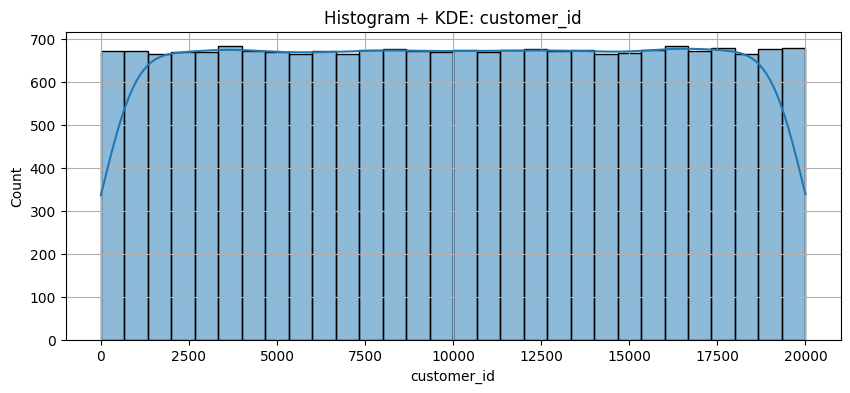

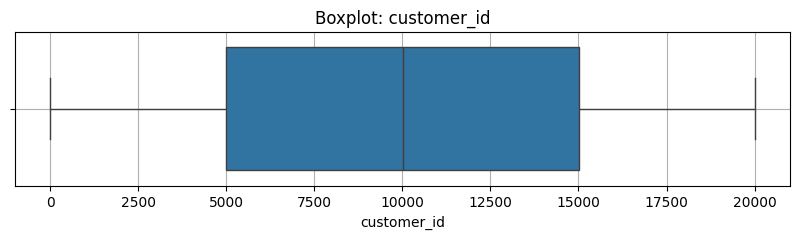


Feature: order_id
   • Skewness   = 0.00
   • Kurtosis   = -1.21
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


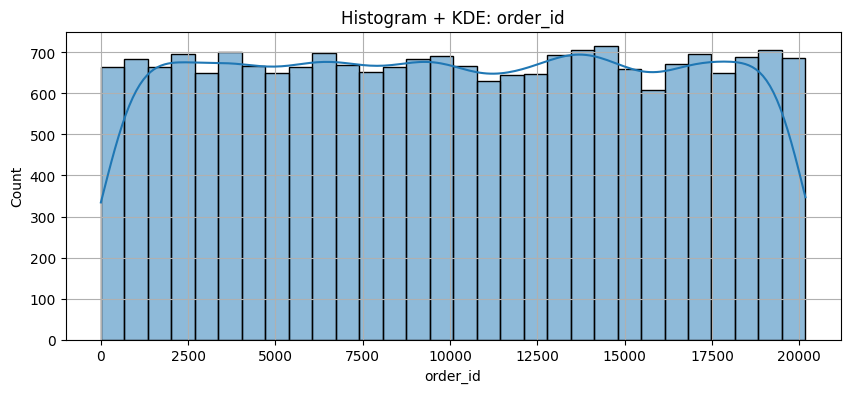

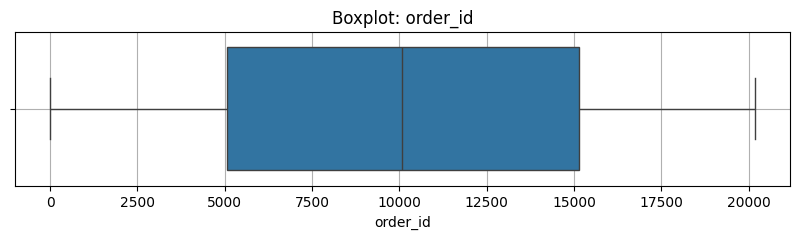


Feature: customer_age
   • Skewness   = -0.02
   • Kurtosis   = -1.19
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


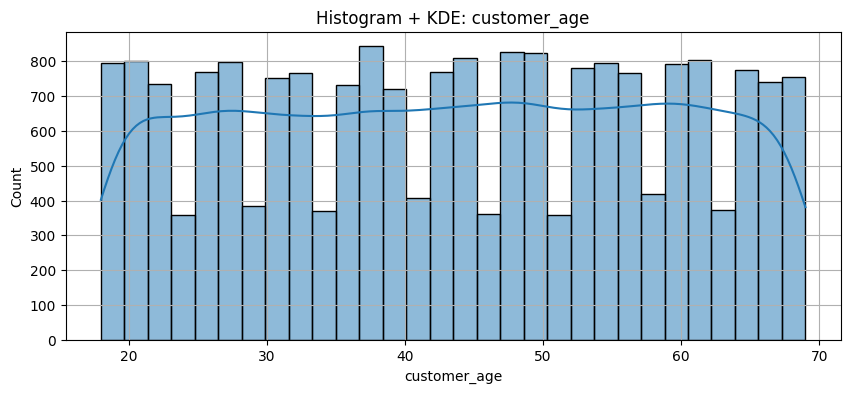

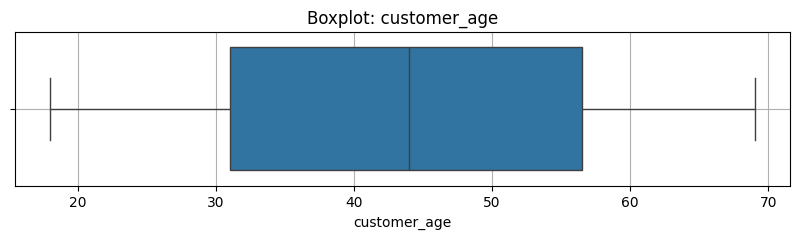


Feature: returned
   • Skewness   = 2.53
   • Kurtosis   = 4.41
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


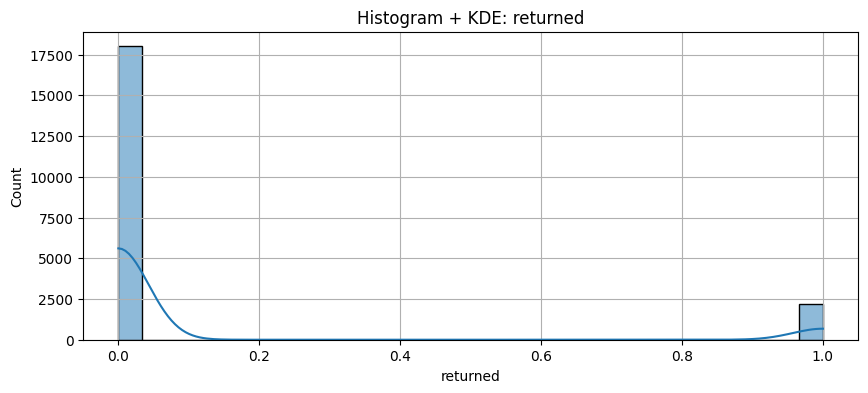

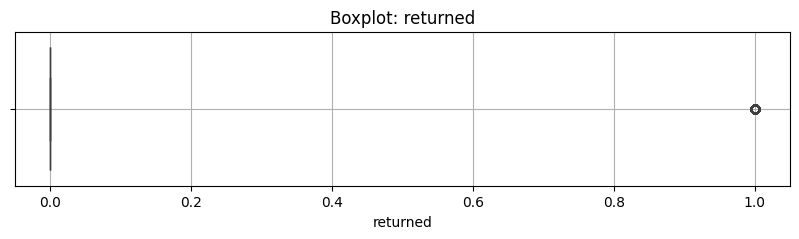


Feature: days_between_orders
   • Skewness   = 0.37
   • Kurtosis   = -1.12
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


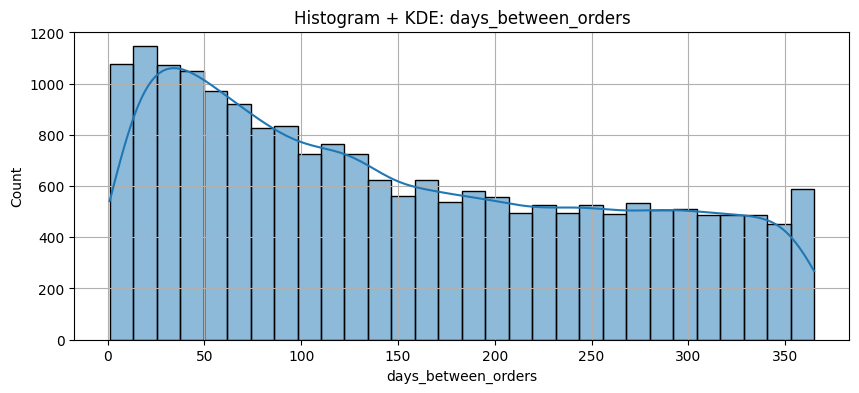

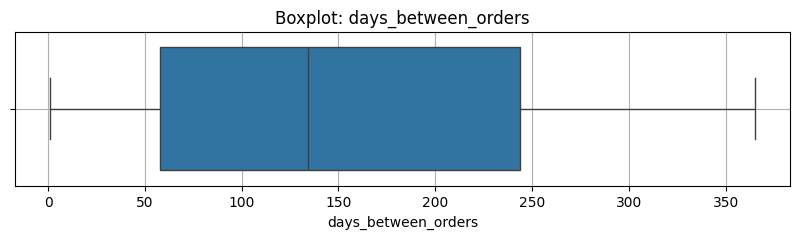


Feature: price
   • Skewness   = 1.41
   • Kurtosis   = 1.64
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Platykurtic (light tails).


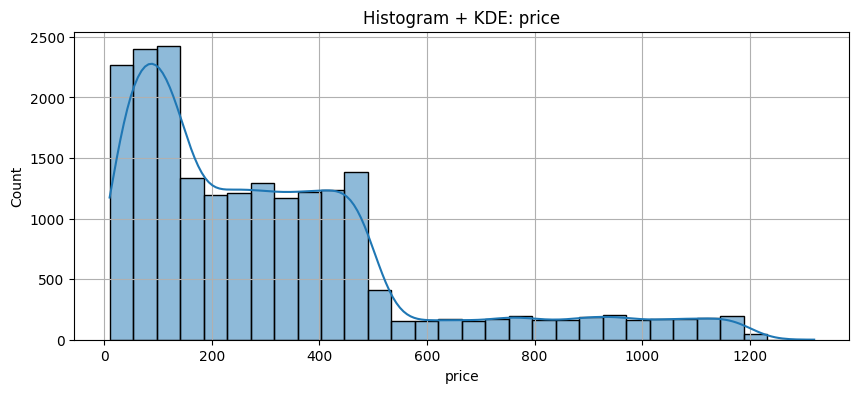

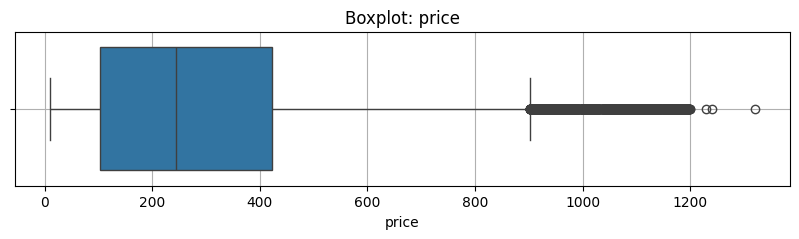


Feature: discount
   • Skewness   = 0.71
   • Kurtosis   = -0.23
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Platykurtic (light tails).


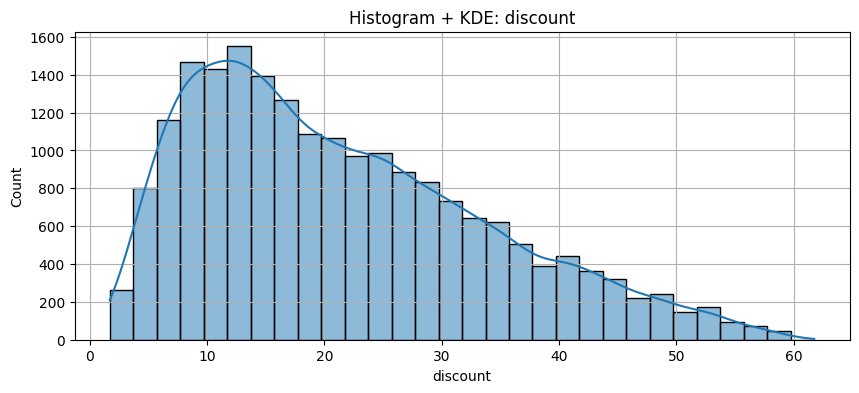

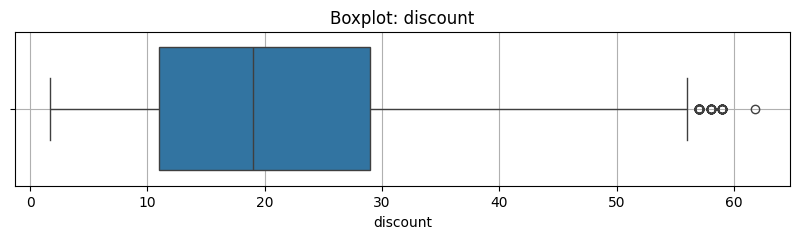


Feature: quantity
   • Skewness   = 1.15
   • Kurtosis   = 1.05
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Platykurtic (light tails).


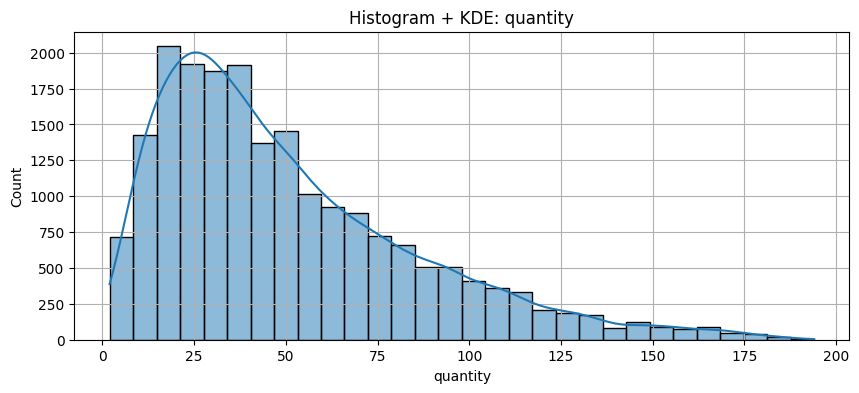

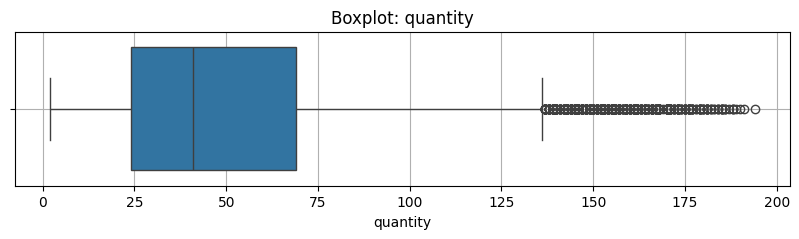


Feature: ad_spend
   • Skewness   = 0.96
   • Kurtosis   = 0.24
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Platykurtic (light tails).


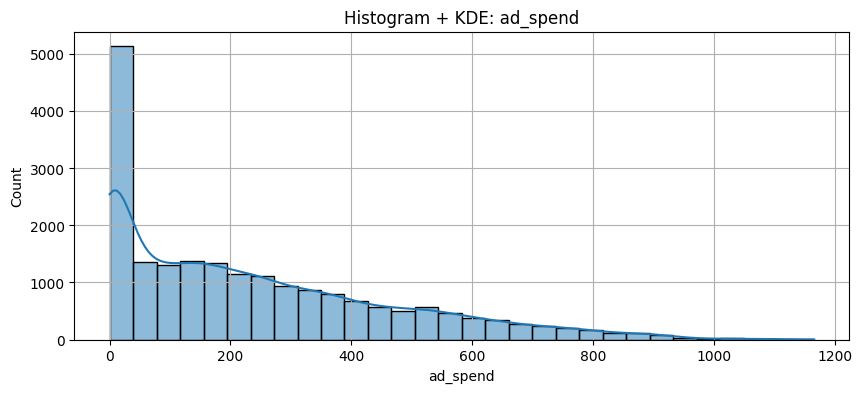

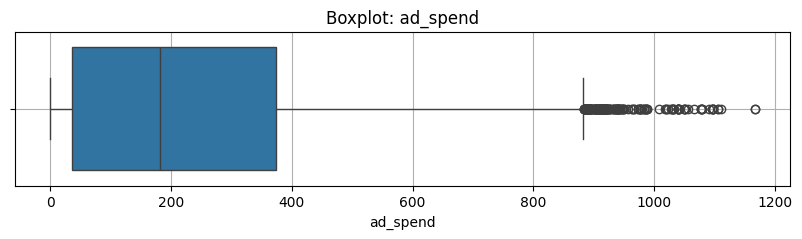


Feature: total_revenue
   • Skewness   = 2.07
   • Kurtosis   = 5.24
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


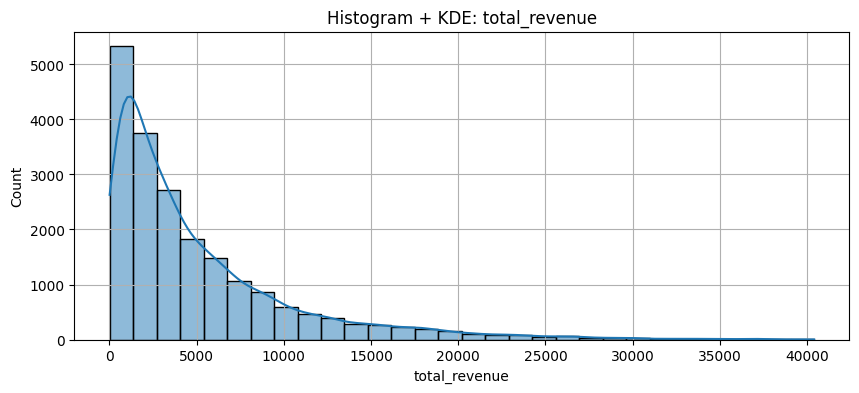

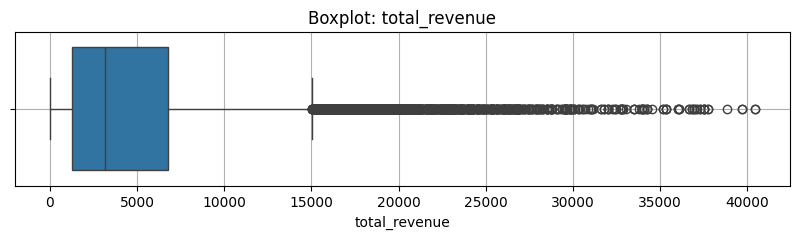


Feature: ROI
   • Skewness   = 19.23
   • Kurtosis   = 550.14
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


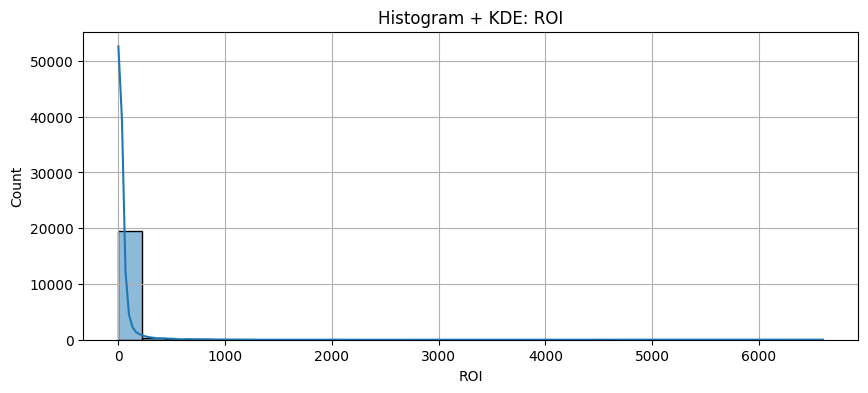

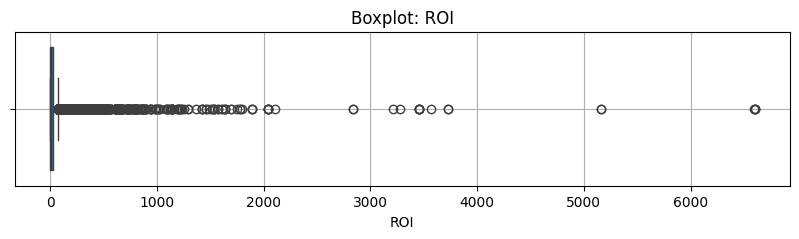


Feature: shipping_cost
   • Skewness   = 2.95
   • Kurtosis   = 12.86
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


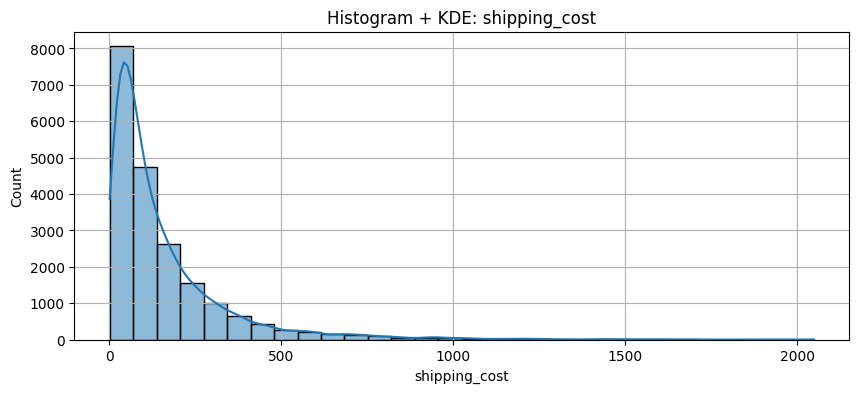

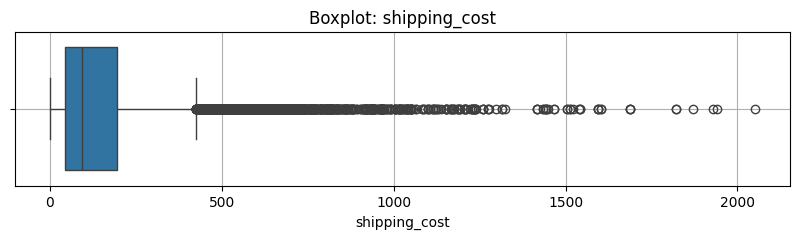


Feature: click_through_rate
   • Skewness   = 0.16
   • Kurtosis   = -1.30
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


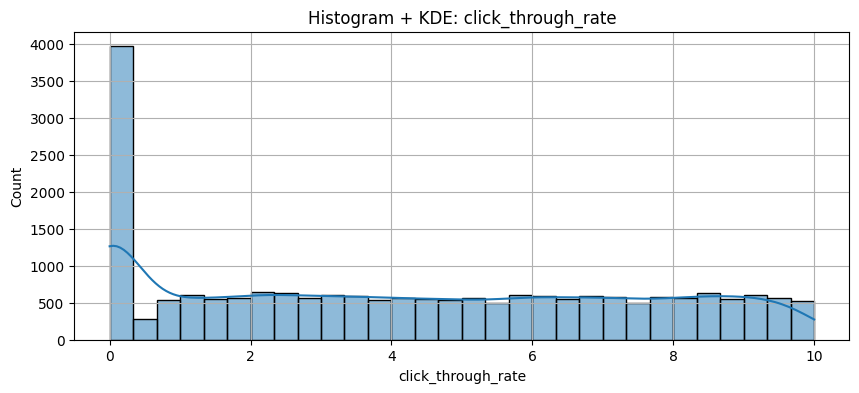

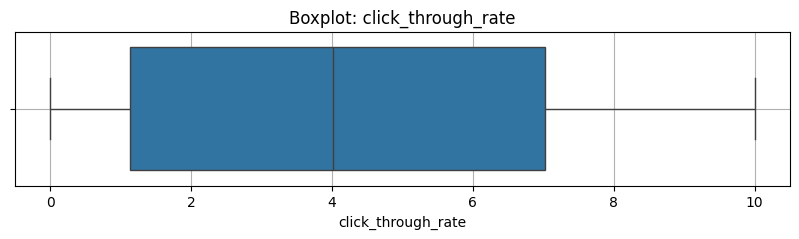


Feature: cost_per_click
   • Skewness   = 0.23
   • Kurtosis   = -1.30
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


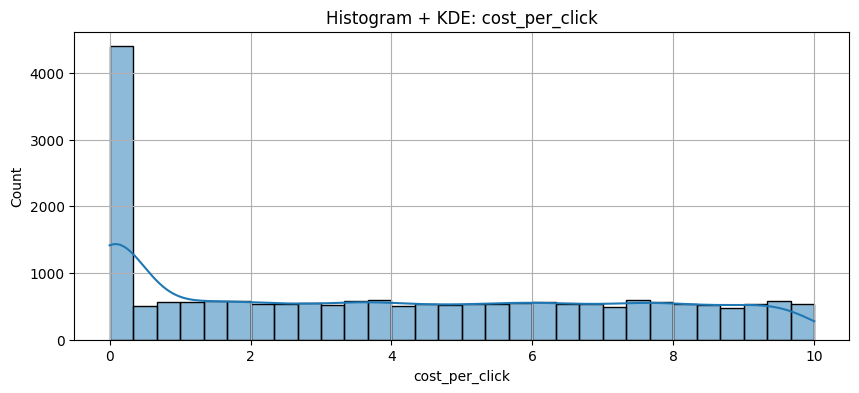

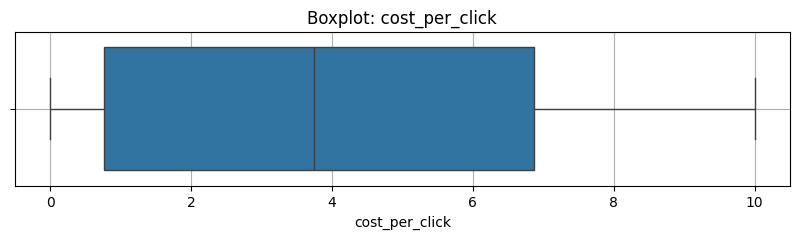


Feature: bounce_rate
   • Skewness   = -0.00
   • Kurtosis   = -1.52
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


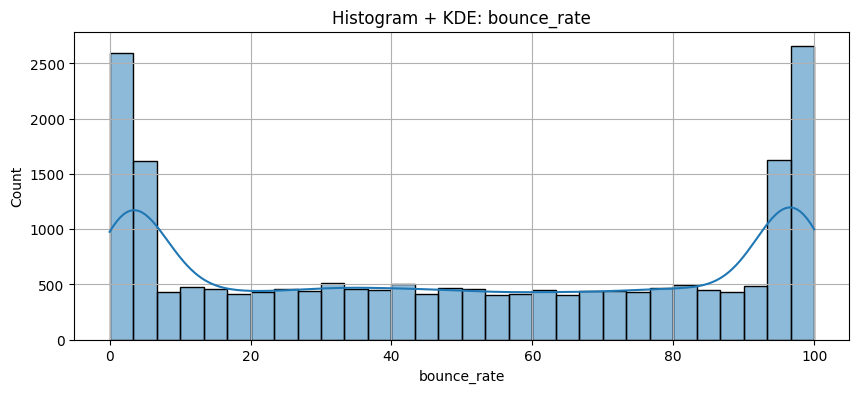

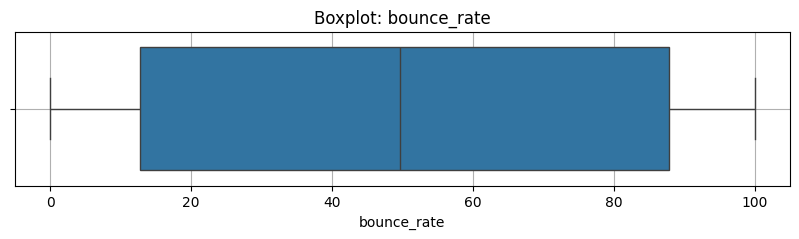


Feature: customer_acquisition_cost
   • Skewness   = 8.51
   • Kurtosis   = 101.63
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


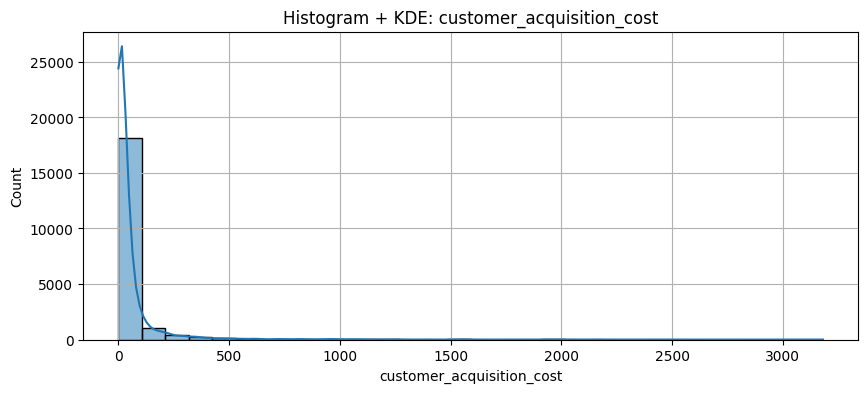

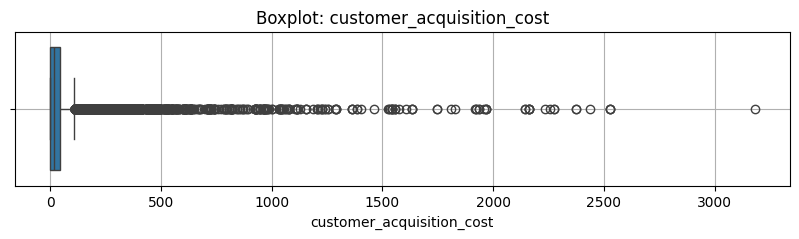


Feature: sales
   • Skewness   = 1.17
   • Kurtosis   = 1.22
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Platykurtic (light tails).


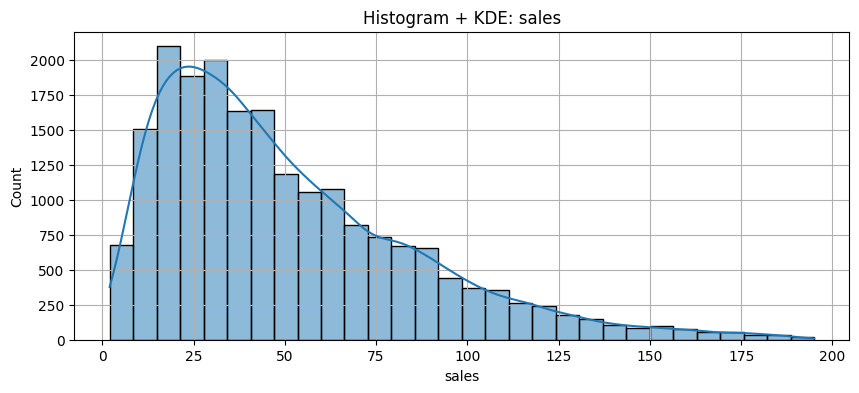

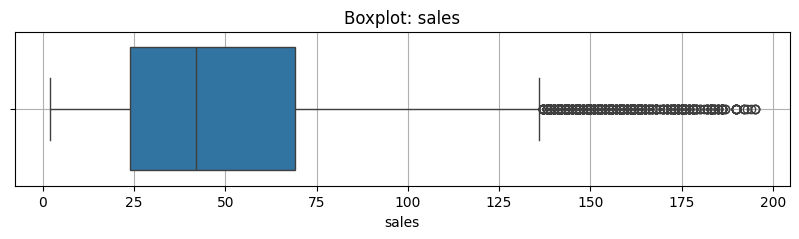


Feature: year
   • Skewness   = 0.02
   • Kurtosis   = -1.24
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


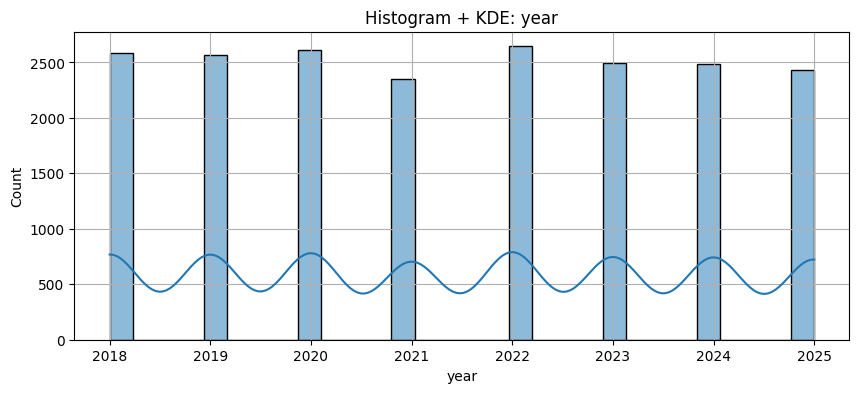

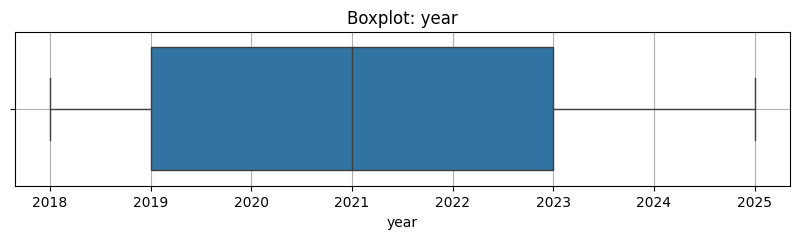


Feature: lost_revenue
   • Skewness   = 5.25
   • Kurtosis   = 31.62
Distribution is right-skewed (positive skew). May need log or sqrt transform.
Leptokurtic (heavy tails, many outliers).


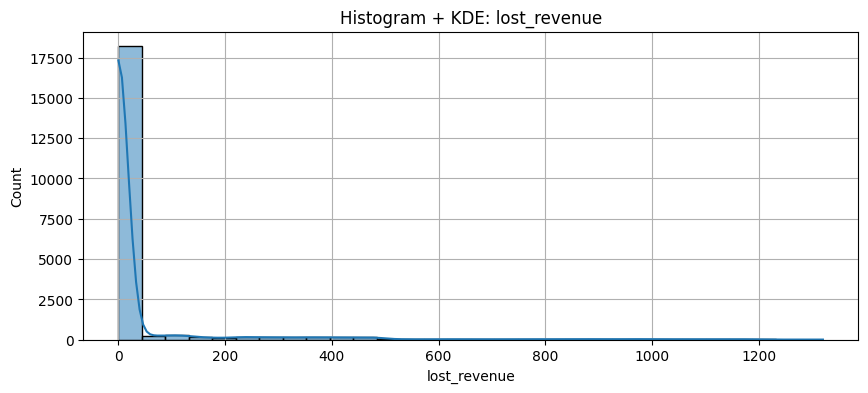

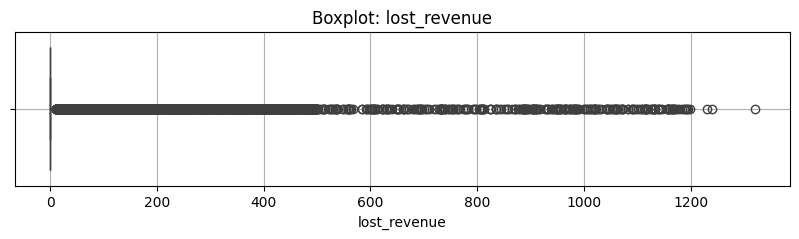


Feature: log_returned
   • Skewness   = 2.53
   • Kurtosis   = 4.41
Distribution is right-skewed (positive skew).
Leptokurtic (heavy tails, many outliers).


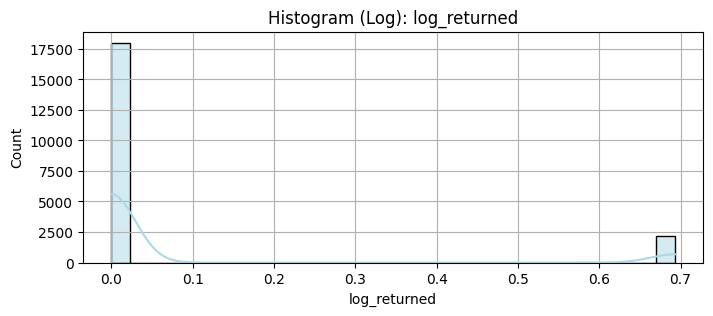

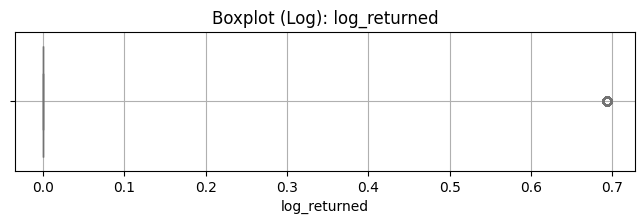


Feature: log_ad_spend
   • Skewness   = -1.06
   • Kurtosis   = -0.42
   ⚠️ Distribution is left-skewed (negative skew).
Platykurtic (light tails).


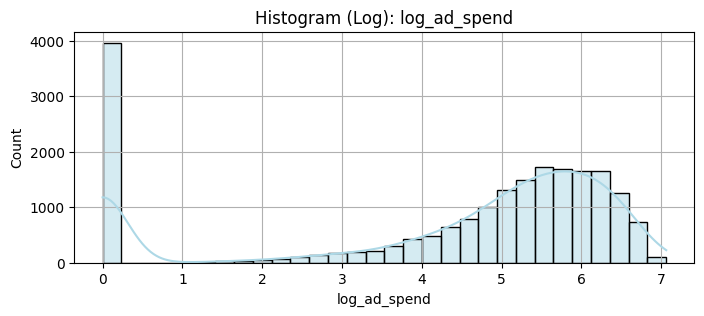

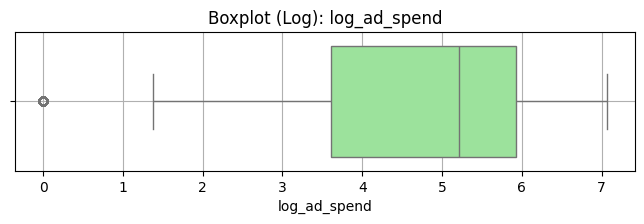


Feature: log_total_revenue
   • Skewness   = -0.61
   • Kurtosis   = 0.39
   ⚠️ Distribution is left-skewed (negative skew).
Platykurtic (light tails).


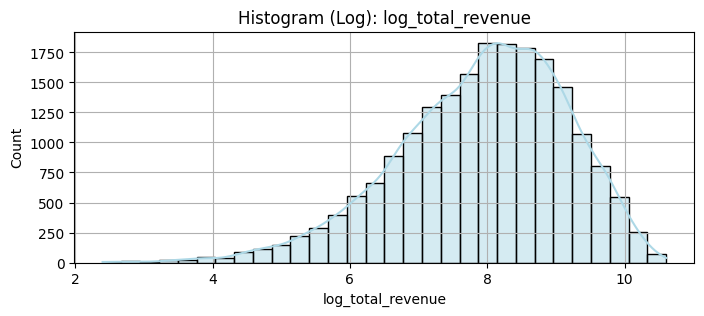

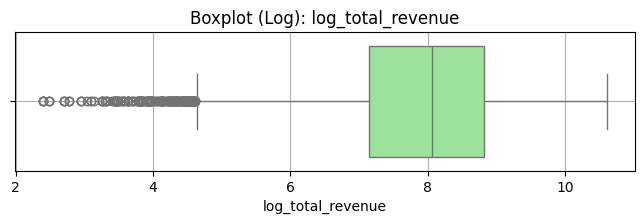


Feature: log_ROI
   • Skewness   = 0.23
   • Kurtosis   = -0.48
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


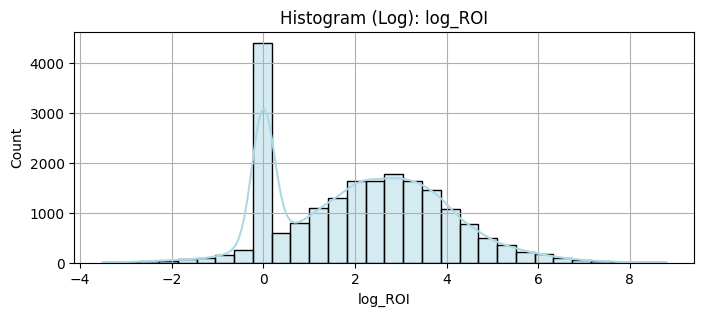

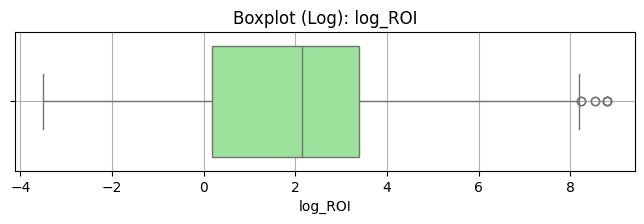


Feature: log_shipping_cost
   • Skewness   = -0.17
   • Kurtosis   = -0.23
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


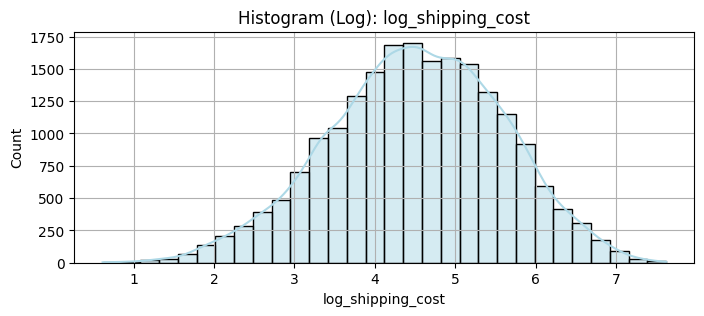

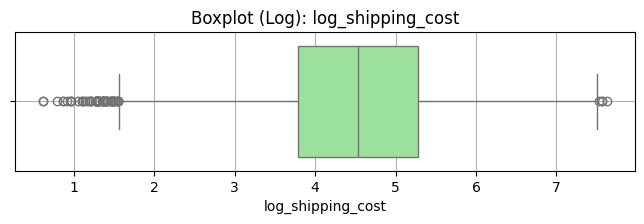


Feature: log_customer_acquisition_cost
   • Skewness   = -0.06
   • Kurtosis   = -1.13
Distribution is approximately symmetric (normal-like).
Platykurtic (light tails).


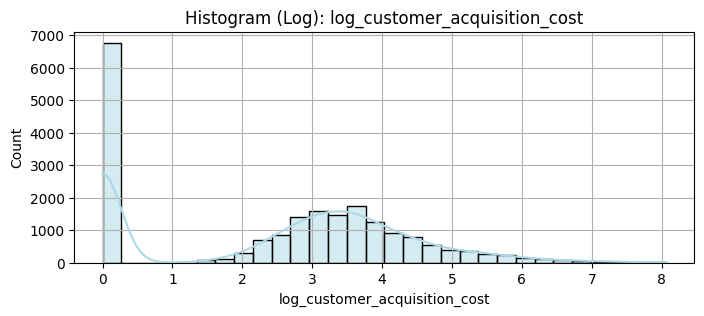

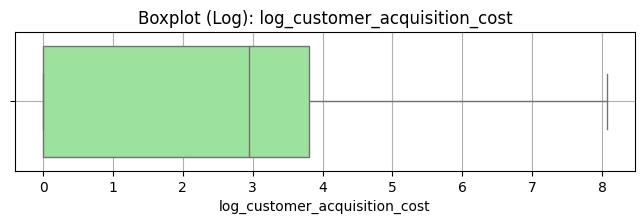


📊 Value Counts for purchase_frequency:
 purchase_frequency
One-time    6838
Loyal       6691
Frequent    6646
Name: count, dtype: int64


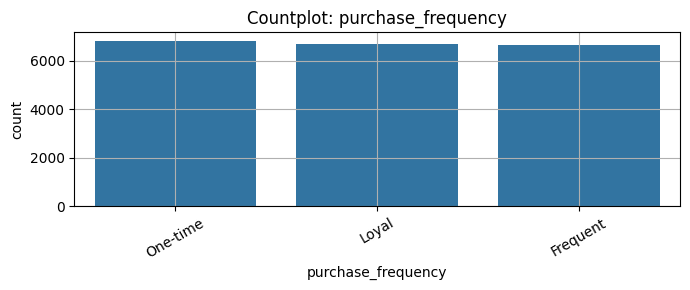


📊 Value Counts for customer_country:
 customer_country
Scotland            5103
Wales               5094
England             5022
Northern Ireland    4956
Name: count, dtype: int64


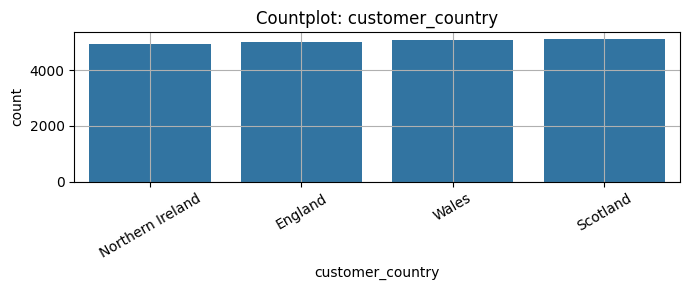


📊 Value Counts for payment_method:
 payment_method
Apple Pay           4095
PayPal              4065
Credit Card         4040
Cash on Delivery    4013
Google Pay          3962
Name: count, dtype: int64


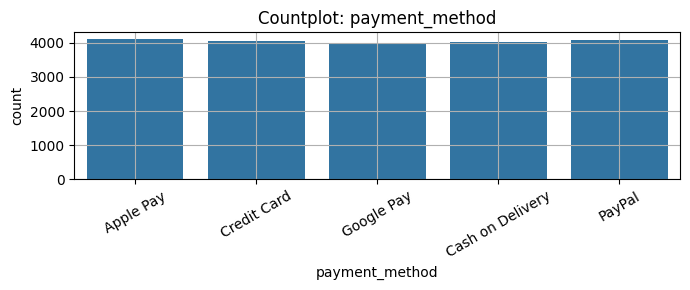


📊 Value Counts for order_time:
 order_time
Afternoon    5125
Evening      5088
Night        4985
Morning      4977
Name: count, dtype: int64


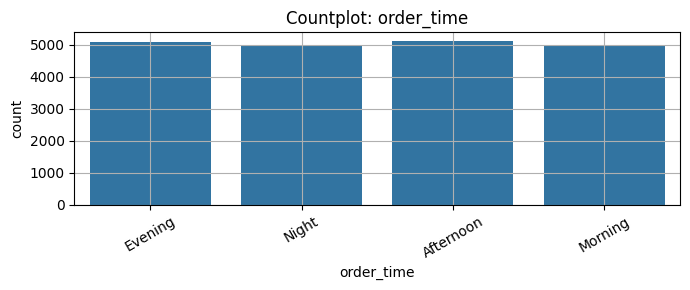


📊 Value Counts for loyalty_segment:
 loyalty_segment
New        10053
Regular     8092
VIP         2030
Name: count, dtype: int64


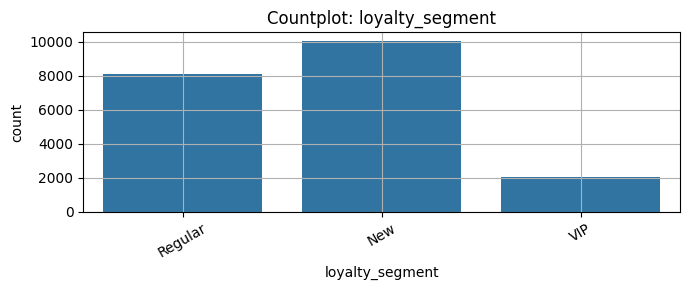


📊 Value Counts for return_reason:
 return_reason
no_return        18020
too_expensive      777
damaged            721
Wrong Item         240
Late Delivery      214
Poor Quality       203
Name: count, dtype: int64


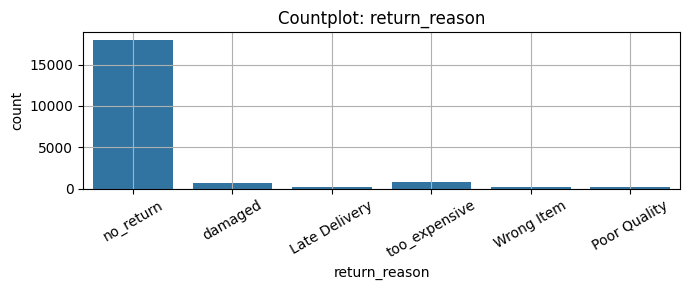


📊 Value Counts for category:
 category
Home & Kitchen       4122
Beauty & Health      4059
Clothing             4048
Sports & Outdoors    4008
Electronics          3938
Name: count, dtype: int64


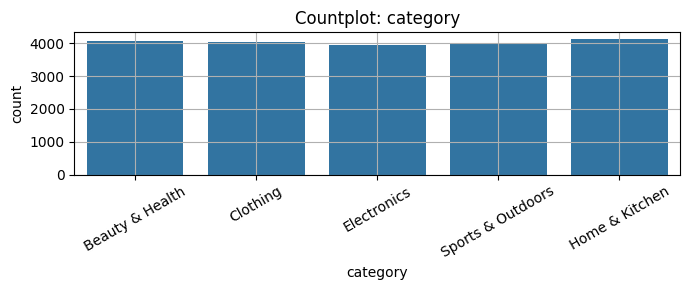


📊 Value Counts for sales_channel:
 sales_channel
Mobile App    10121
Website        6090
Referral       3964
Name: count, dtype: int64


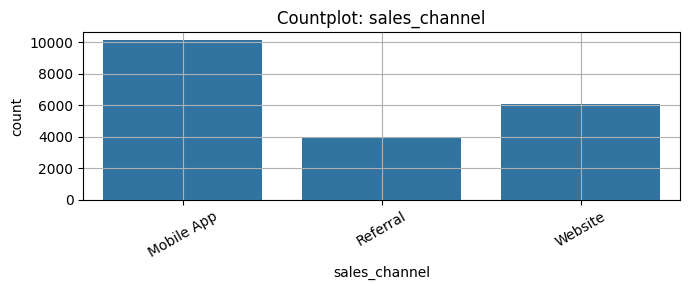


📊 Value Counts for traffic_source:
 traffic_source
Google Ads        7754
Facebook Ads      3856
Organic Search    2808
Direct            1919
Referral           990
YouTube Ads        910
TikTok Ads         577
Email Campaign     561
LinkedIn Ads       413
Banner Ads         387
Name: count, dtype: int64


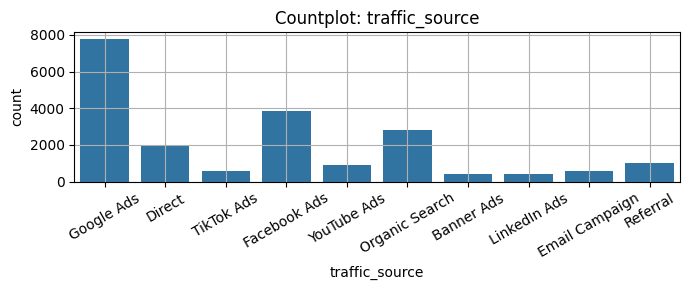


📊 Value Counts for order_day:
 order_day
Monday       3006
Tuesday      2976
Friday       2894
Wednesday    2891
Sunday       2827
Thursday     2798
Saturday     2783
Name: count, dtype: int64


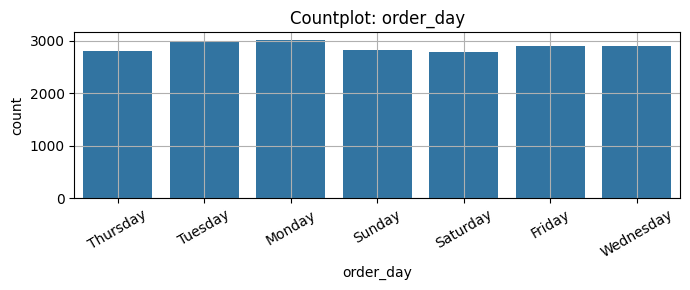


📊 Value Counts for order_month:
 order_month
January      1875
December     1765
September    1758
August       1713
June         1711
March        1697
October      1688
April        1649
July         1647
November     1629
May          1579
February     1464
Name: count, dtype: int64


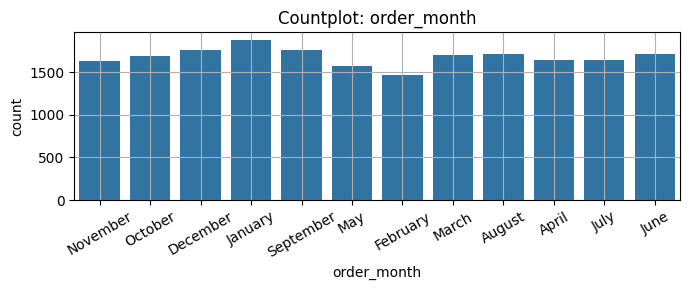

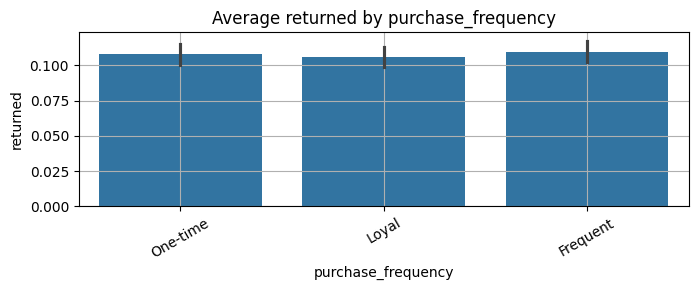

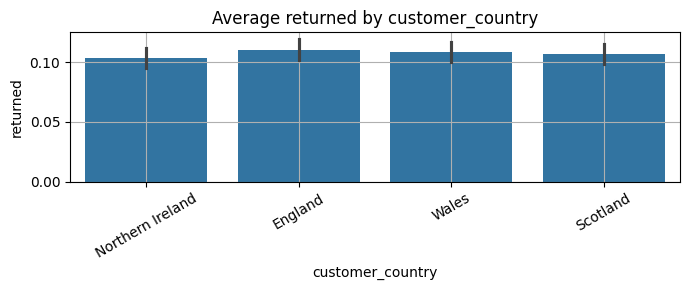

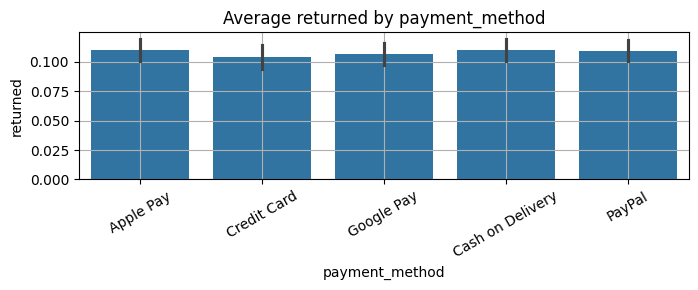

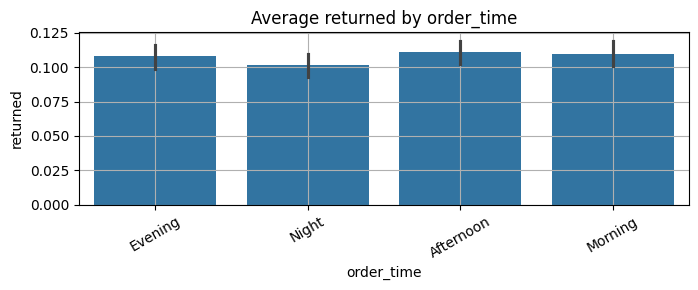

...

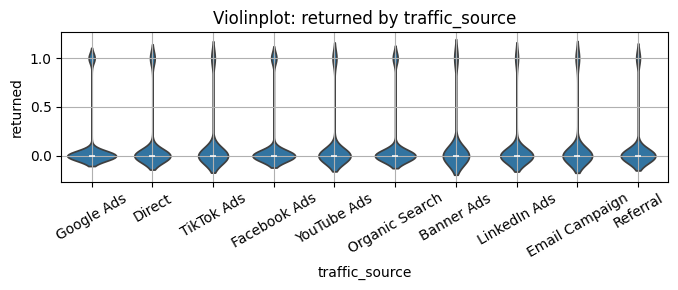

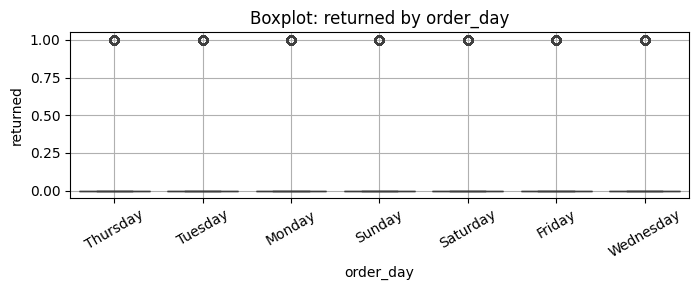

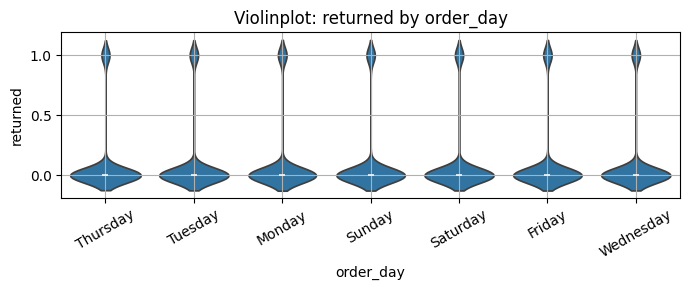

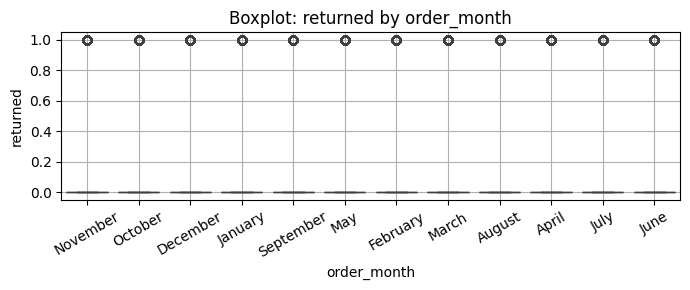

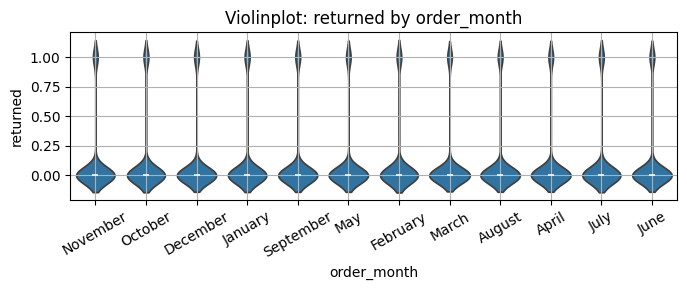

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


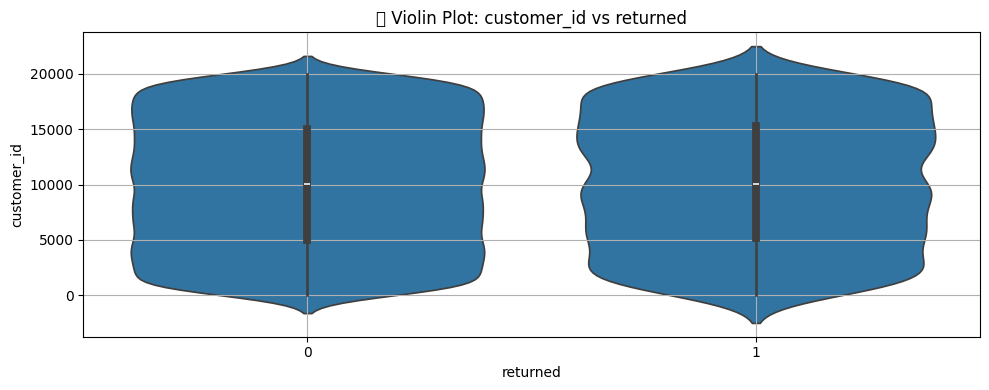

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


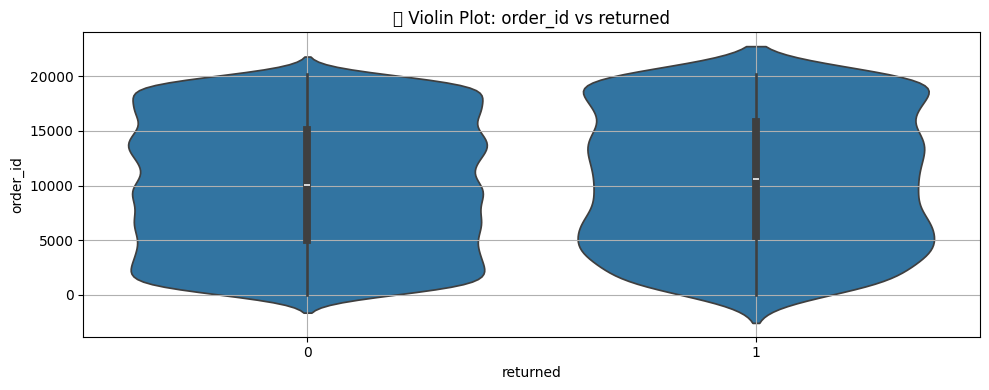

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


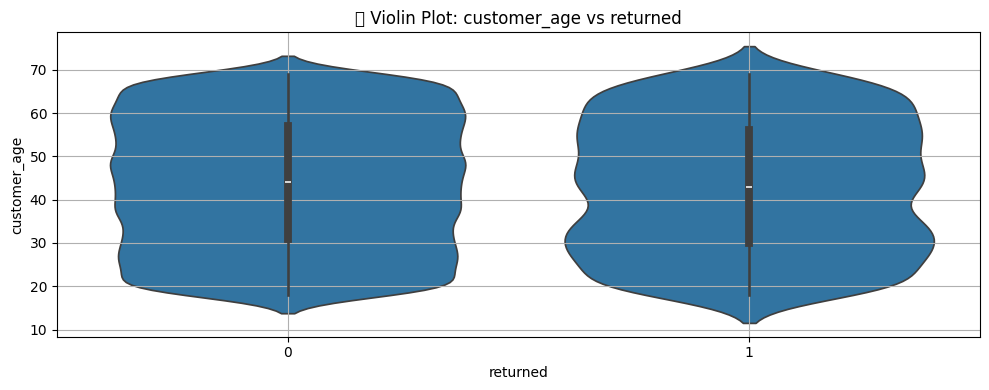

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


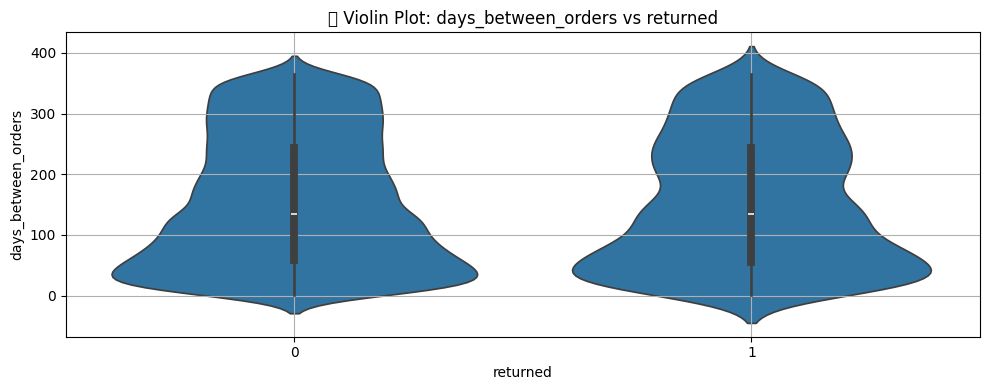

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


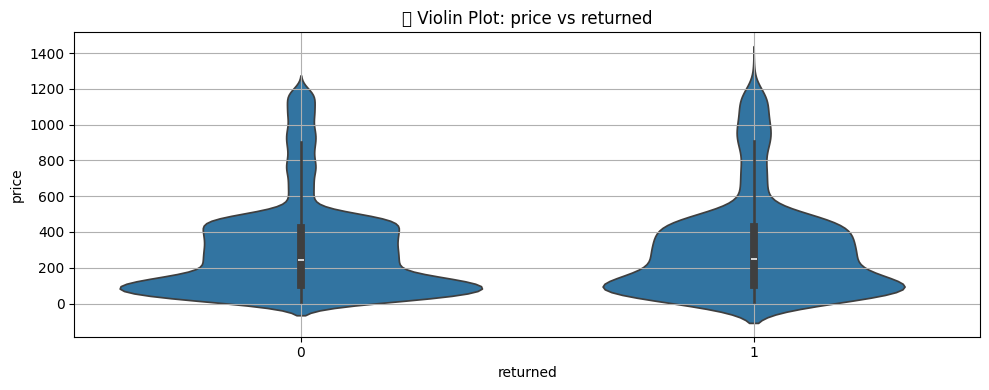

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


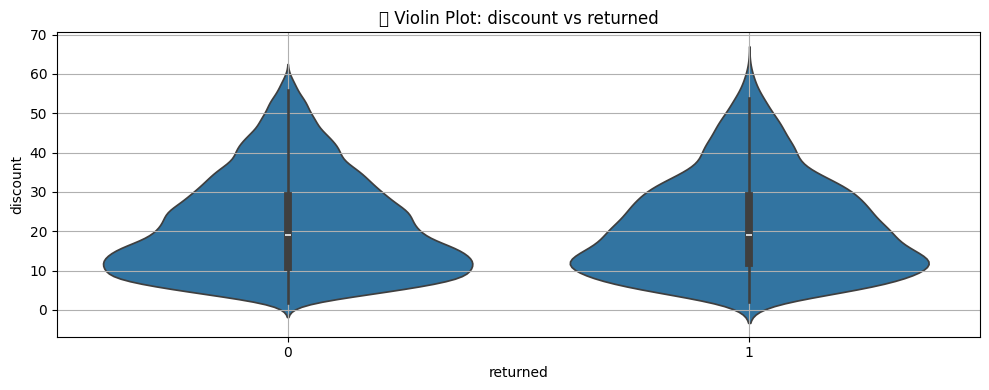

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


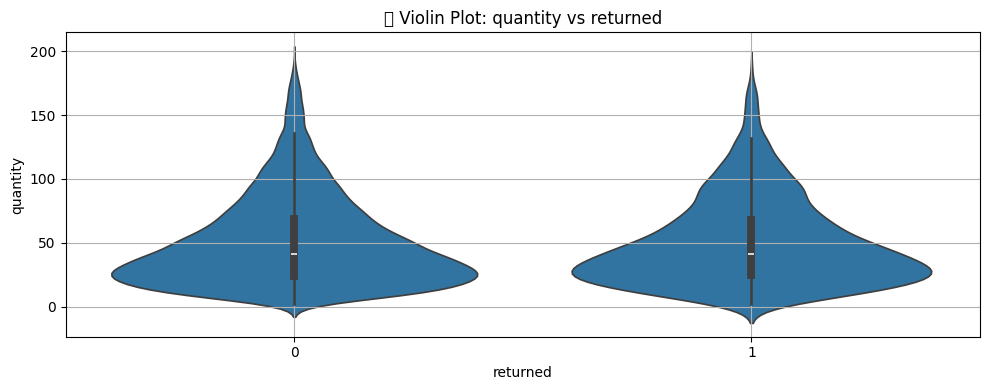

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


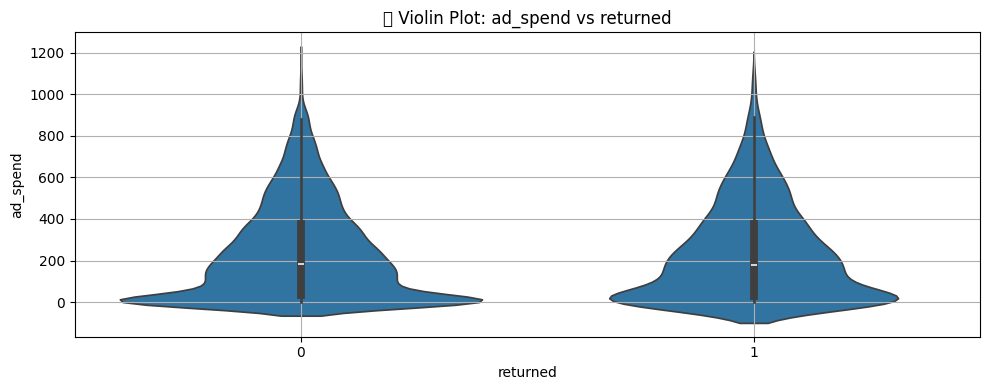

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


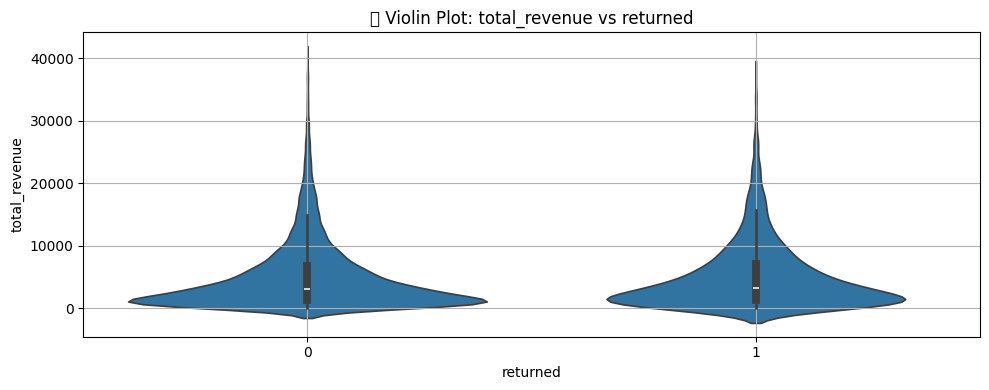

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


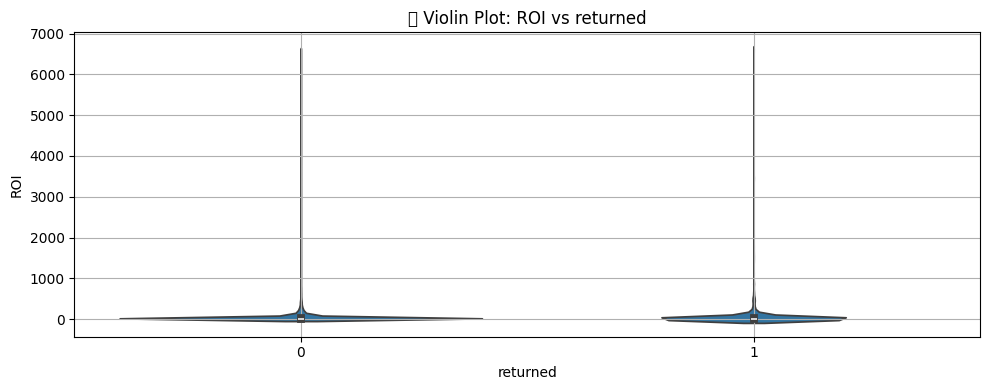

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


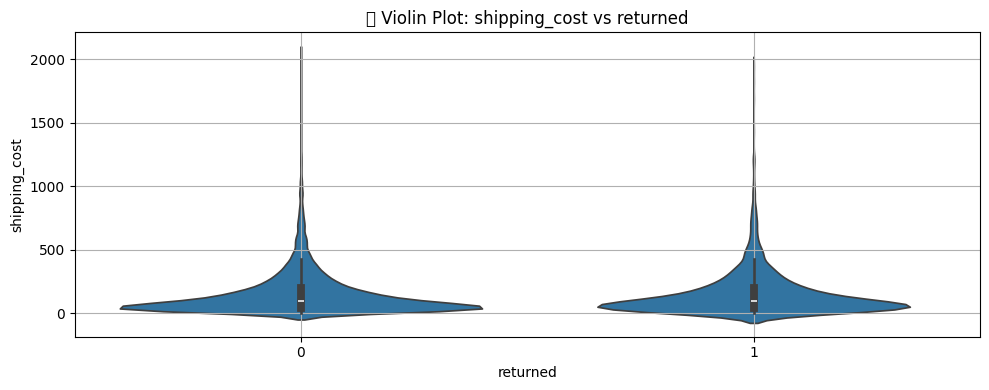

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


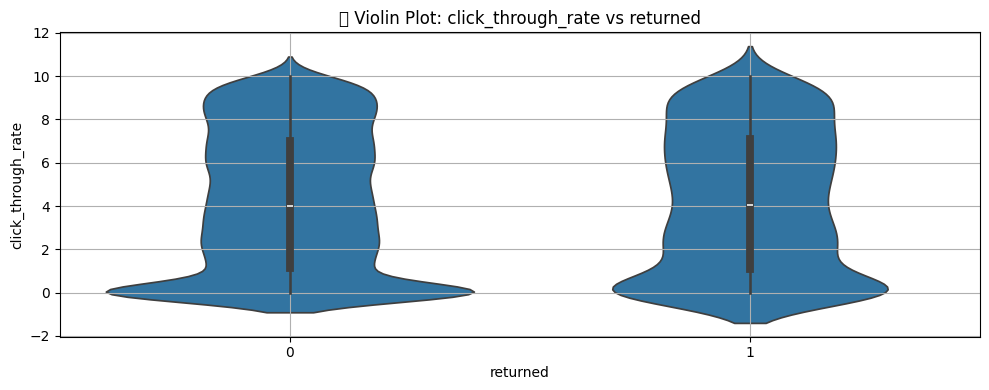

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


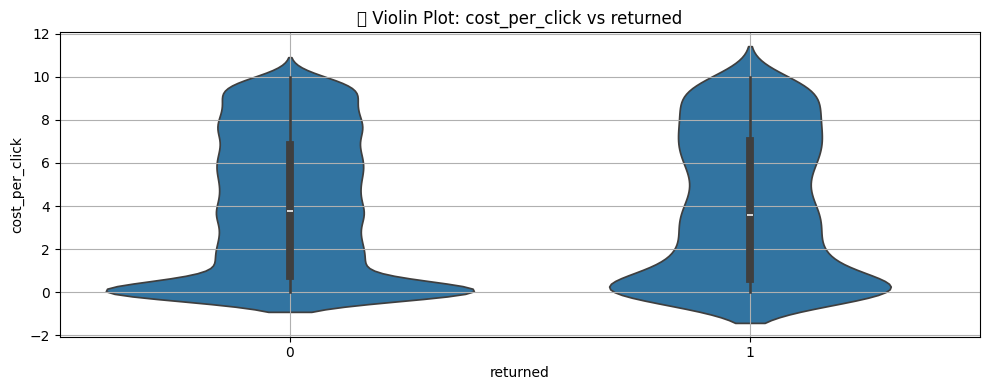

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


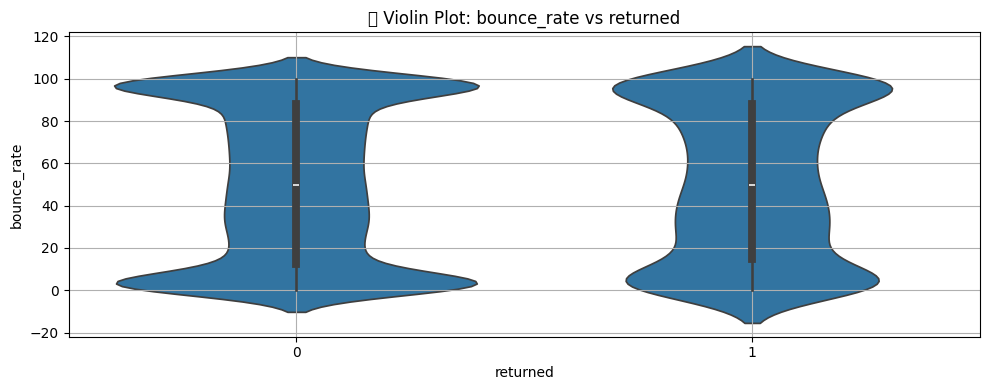

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


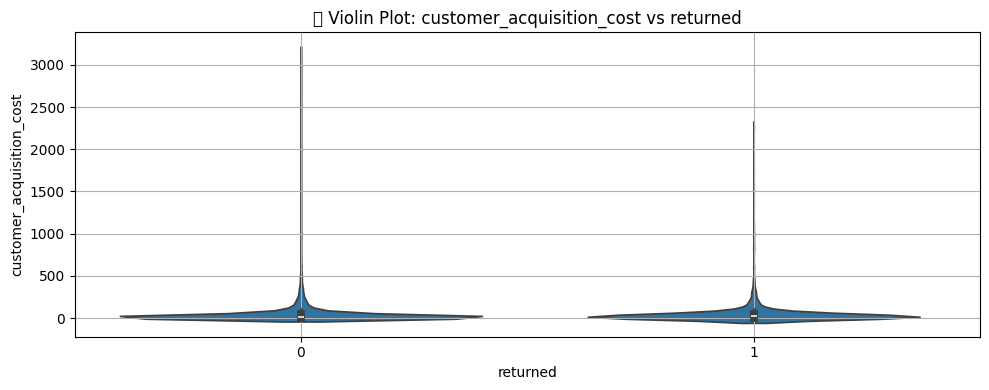

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


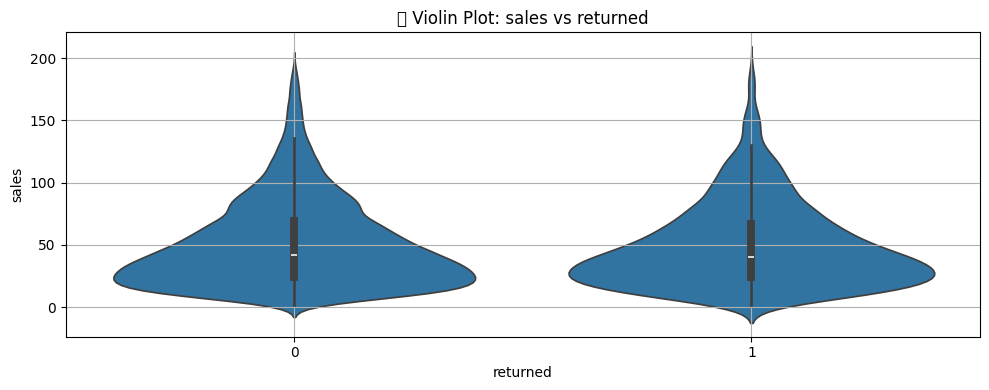

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


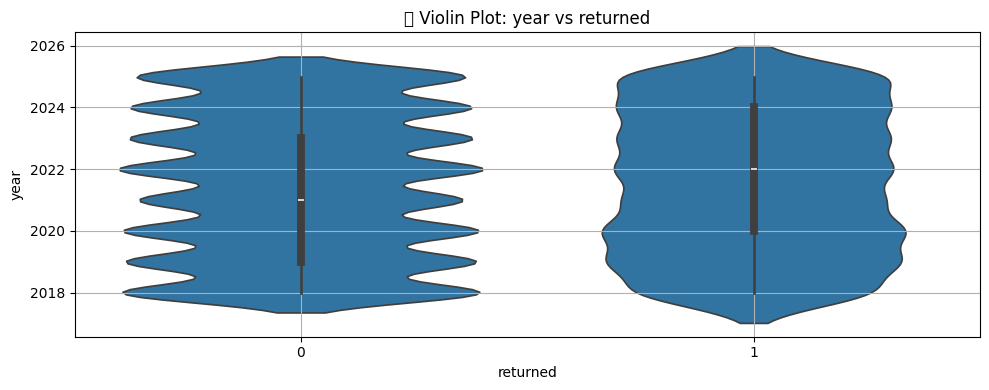

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


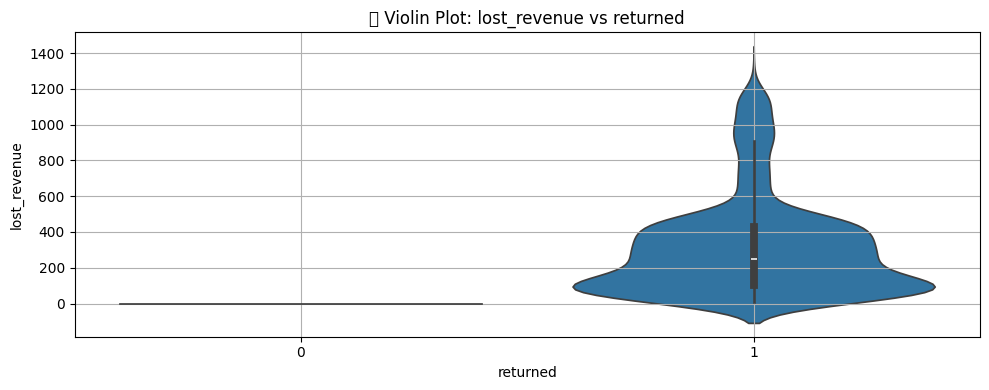

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


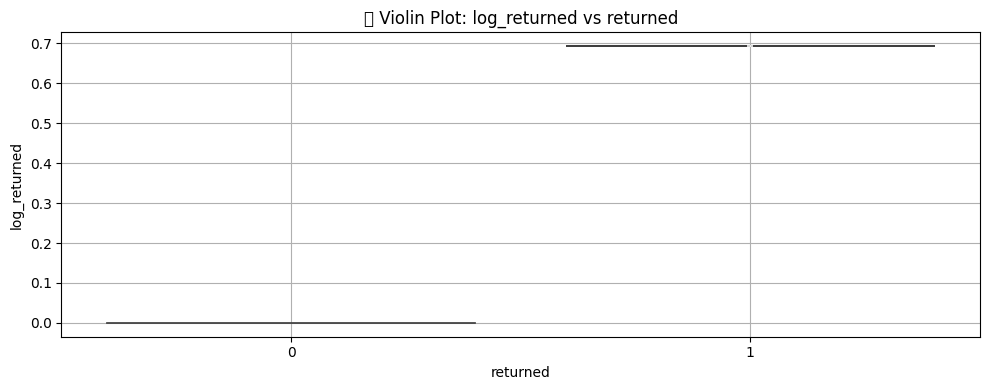

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


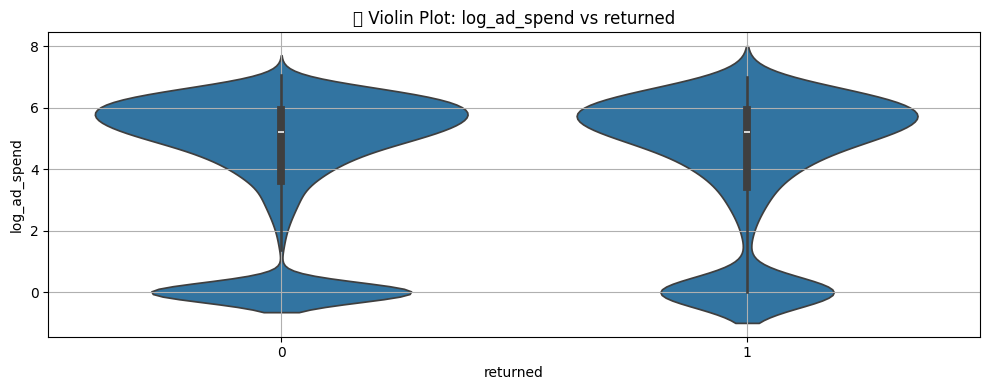

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


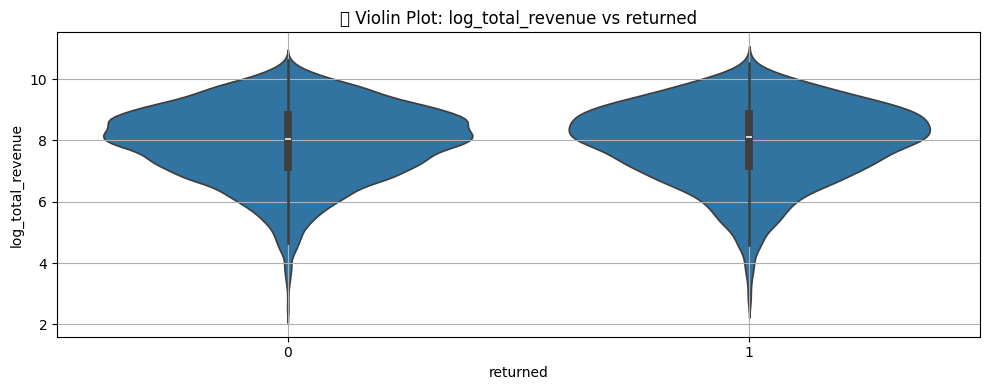

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


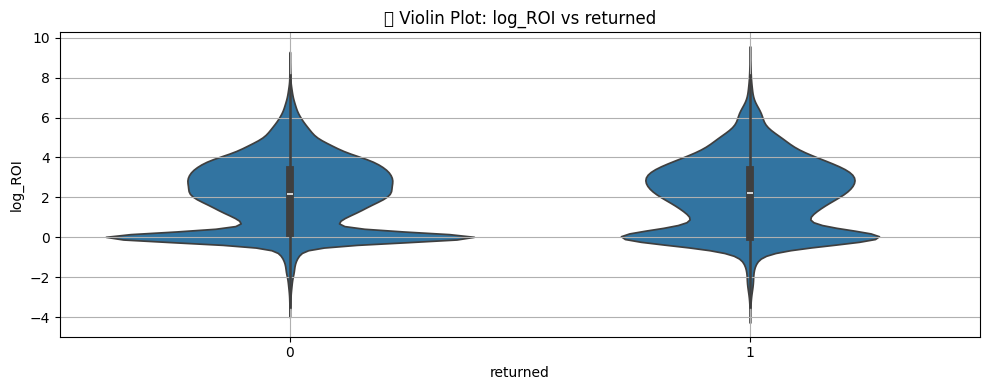

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


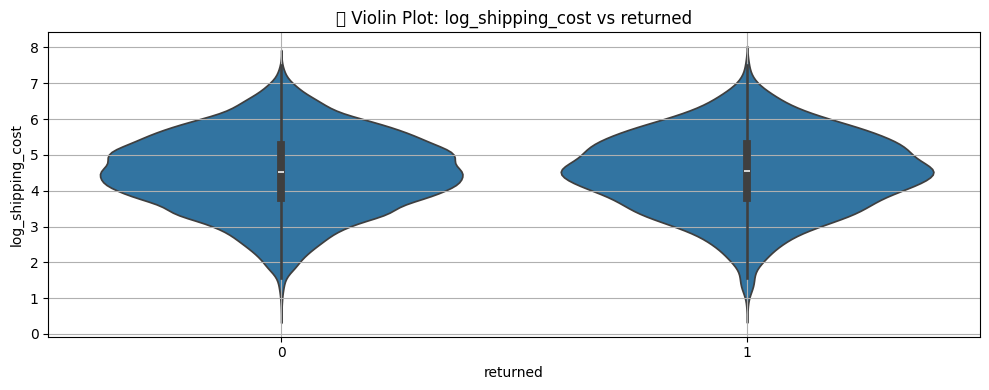

<ipython-input-26-207a6dbcde91>:150: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127931 (\N{VIOLIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


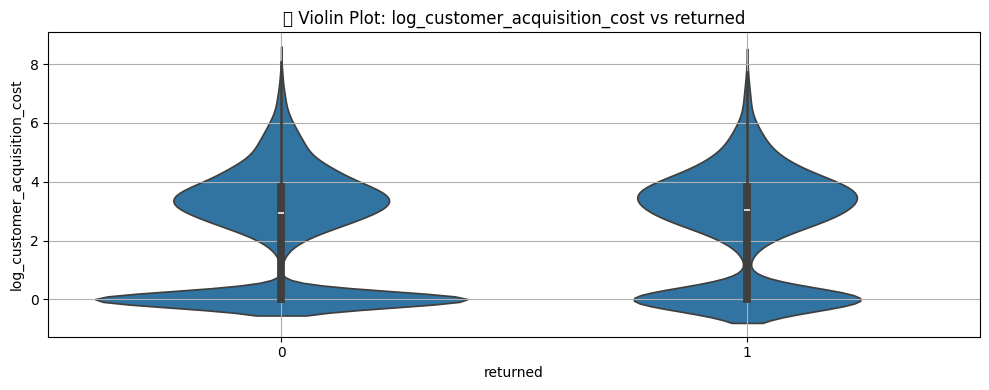

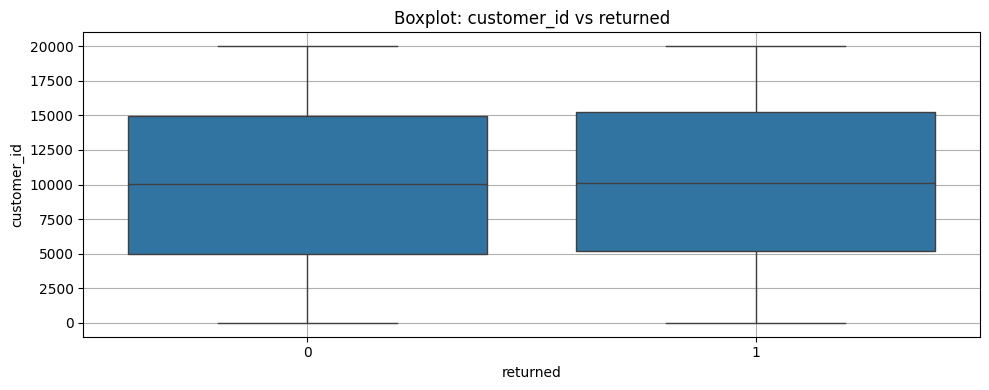

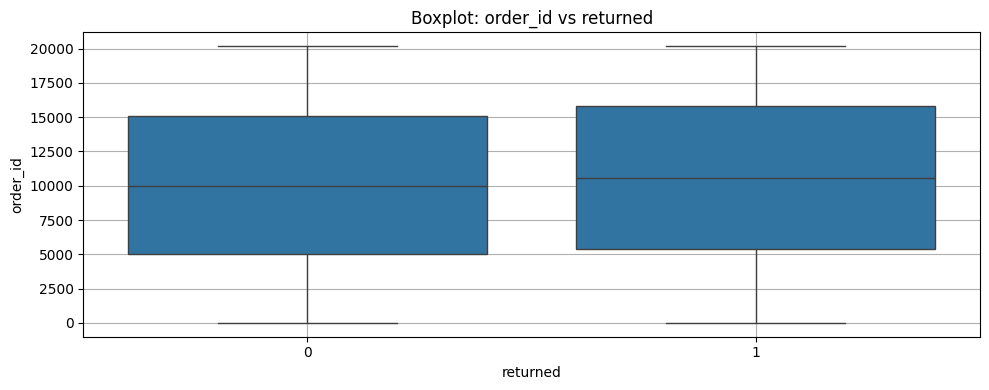

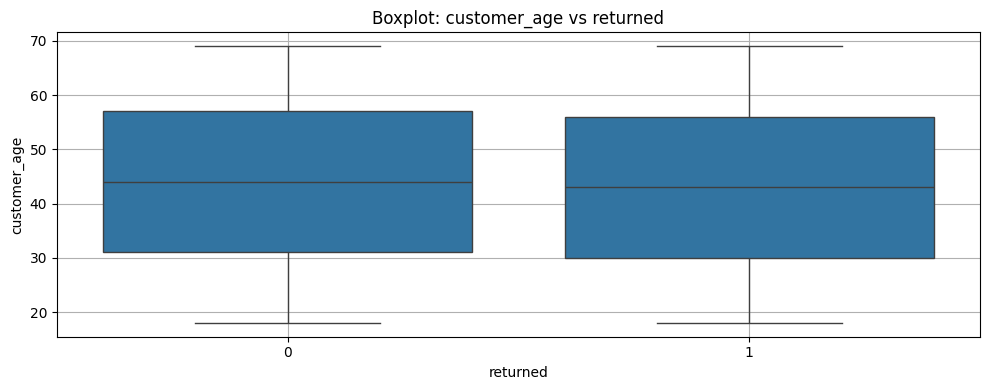

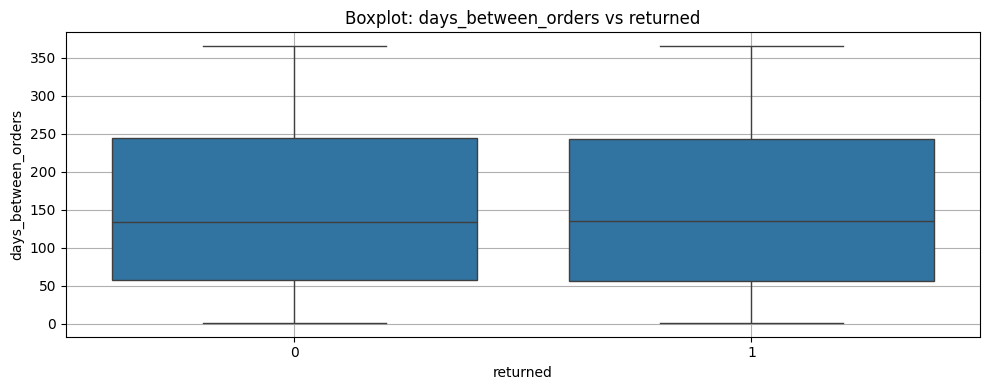

...

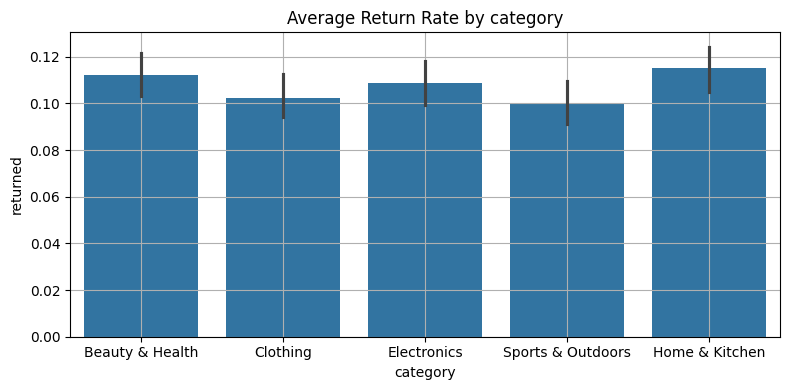

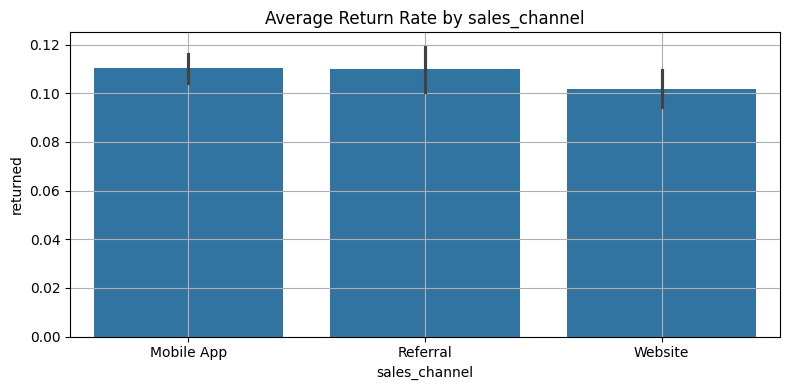

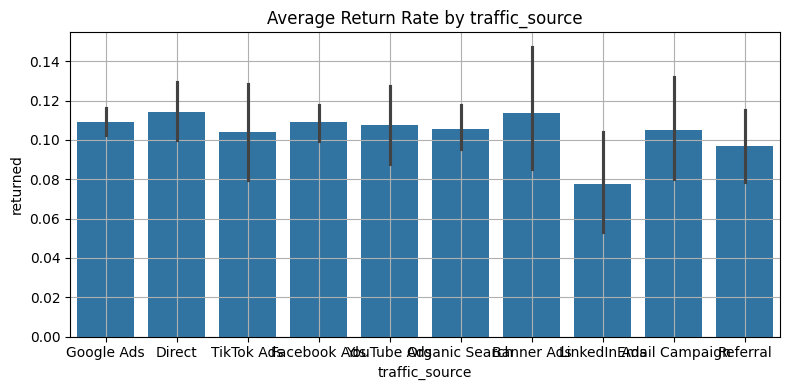

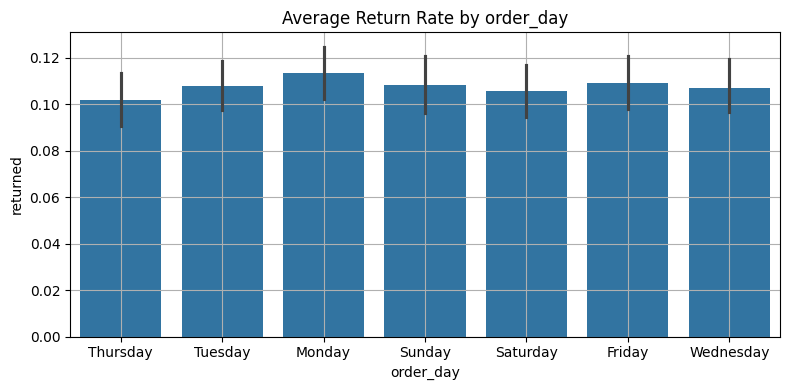

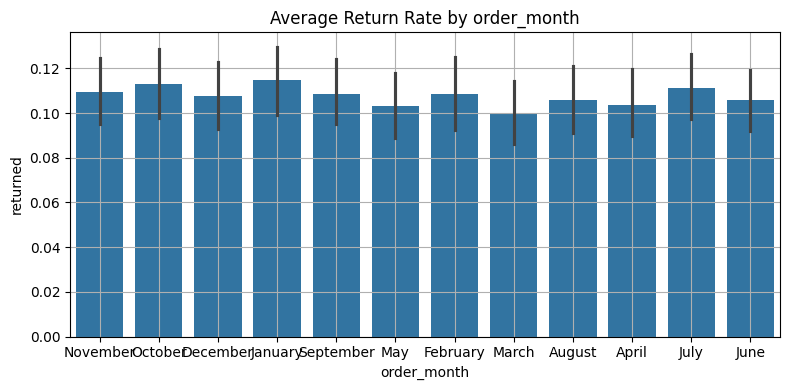


 Value Counts for purchase_frequency:

purchase_frequency
One-time    6838
Loyal       6691
Frequent    6646
Name: count, dtype: int64

 Value Counts for customer_country:

customer_country
Scotland            5103
Wales               5094
England             5022
Northern Ireland    4956
Name: count, dtype: int64

 Value Counts for payment_method:

payment_method
Apple Pay           4095
PayPal              4065
Credit Card         4040
Cash on Delivery    4013
Google Pay          3962
Name: count, dtype: int64

 Value Counts for order_time:

order_time
Afternoon    5125
Evening      5088
Night        4985
Morning      4977
Name: count, dtype: int64

 Value Counts for loyalty_segment:

loyalty_segment
New        10053
Regular     8092
VIP         2030
Name: count, dtype: int64

 Value Counts for return_reason:

return_reason
no_return        18020
too_expensive      777
damaged            721
Wrong Item         240
Late Delivery      214
Poor Quality       203
Name: count, dtype: int

<ipython-input-26-207a6dbcde91>:180: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


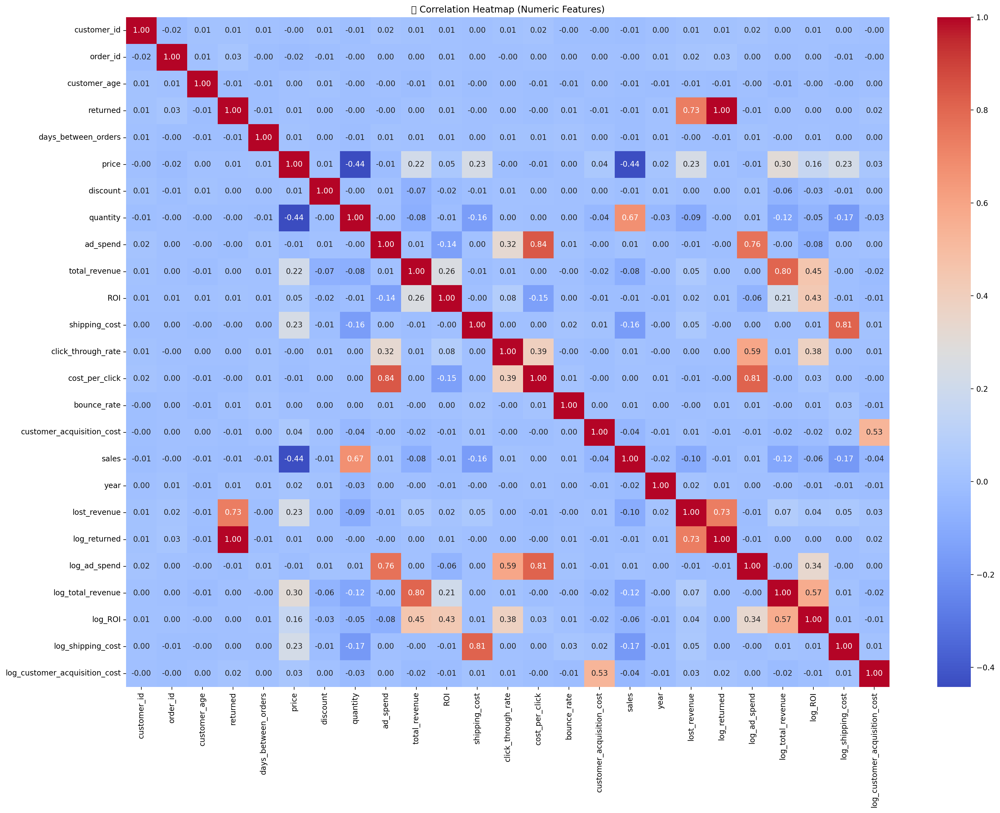

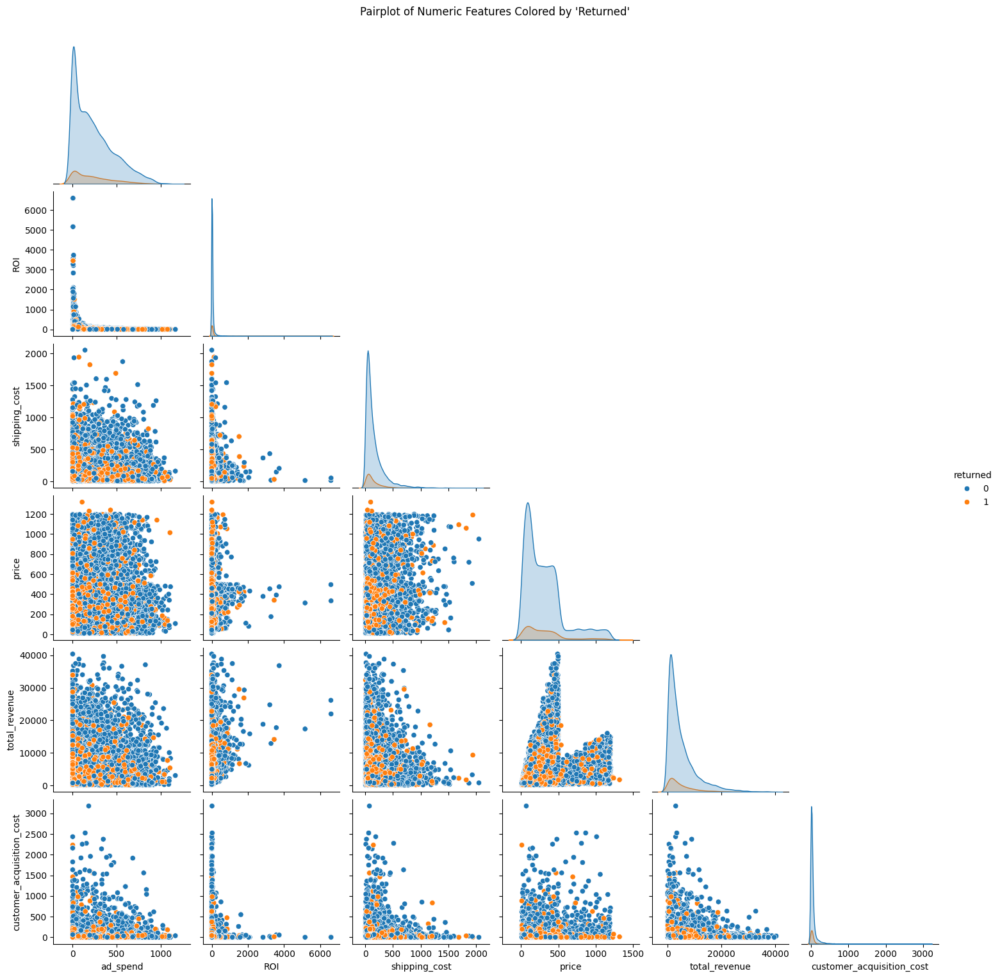

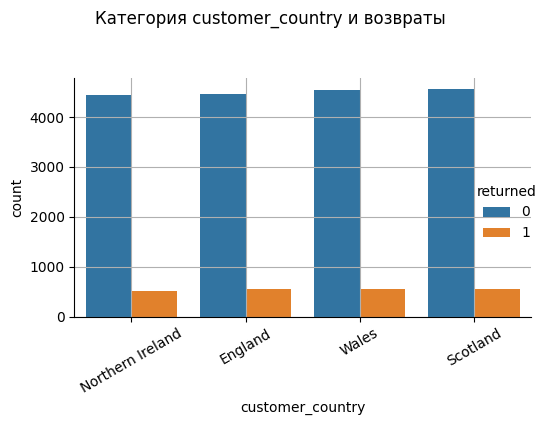

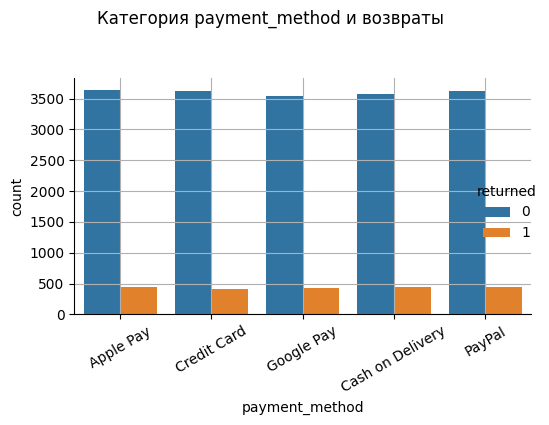

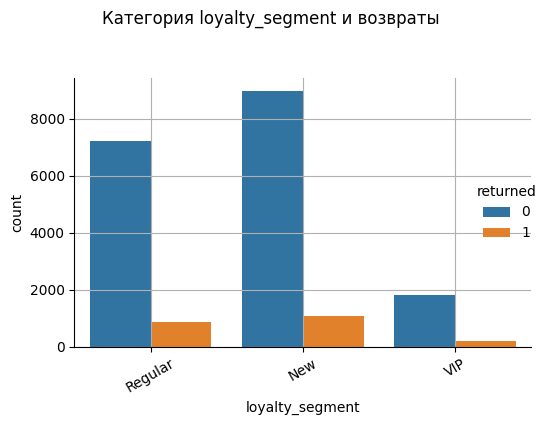

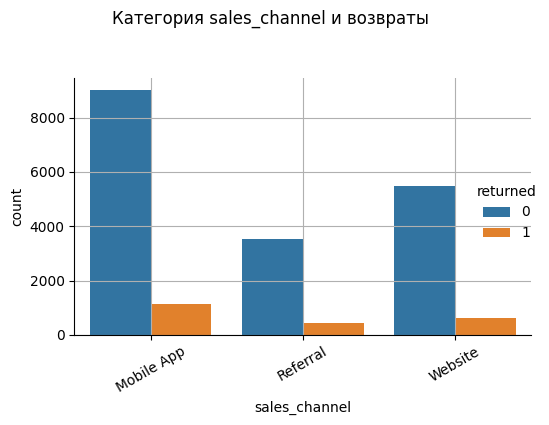

<ipython-input-26-207a6dbcde91>:206: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=merged_df, x="returned", palette="Set2")


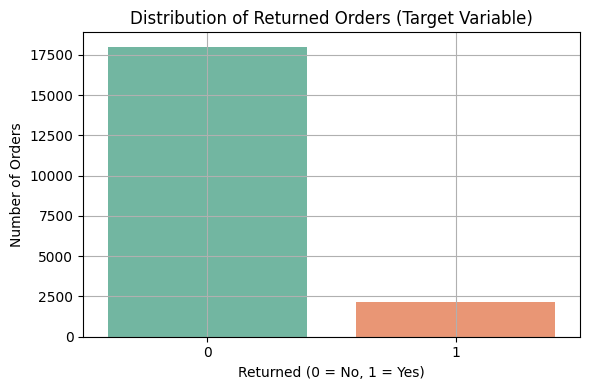

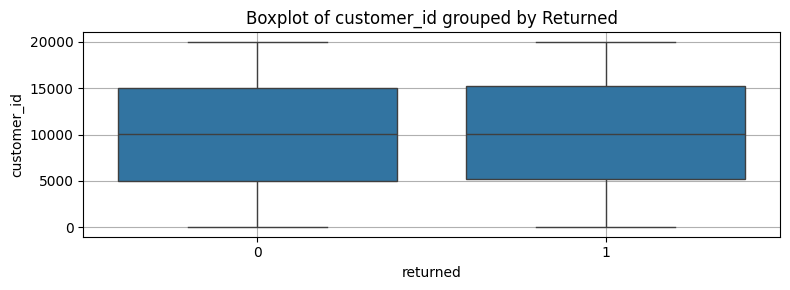

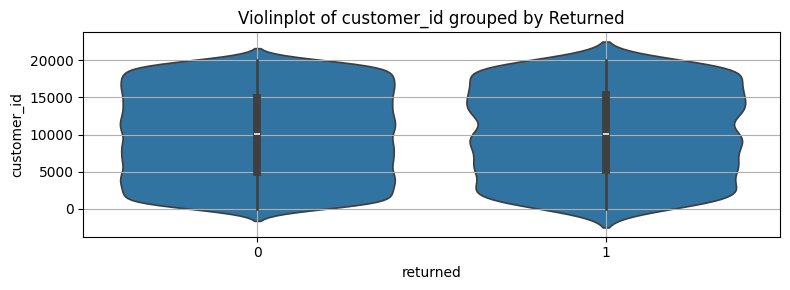

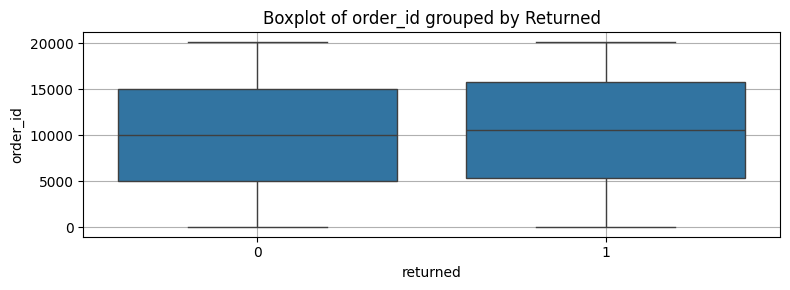

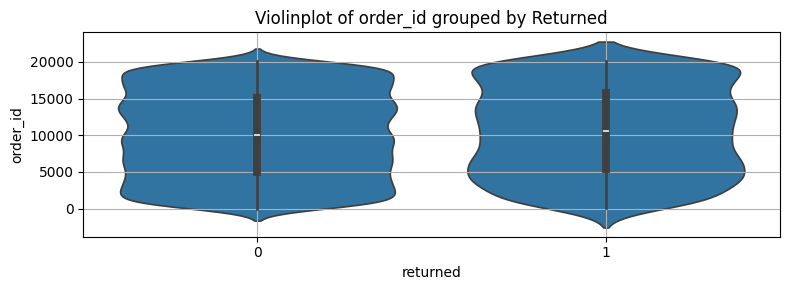

...

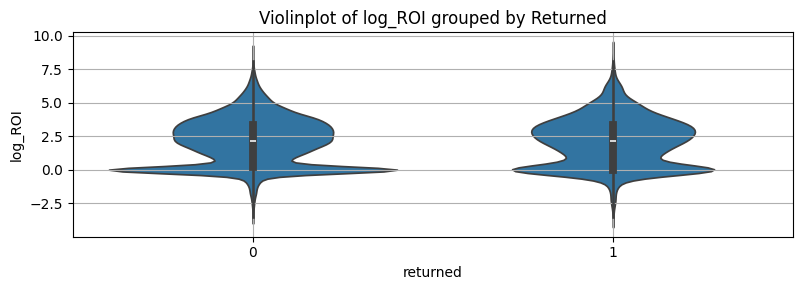

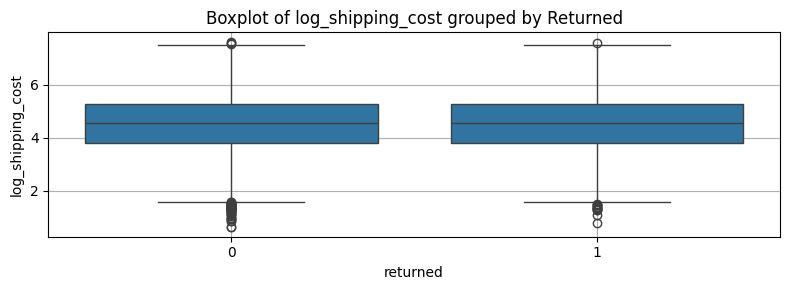

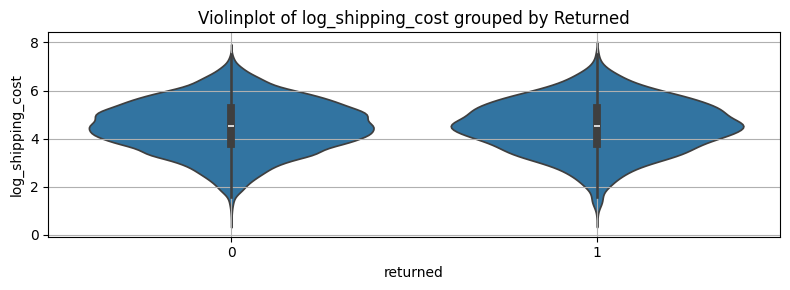

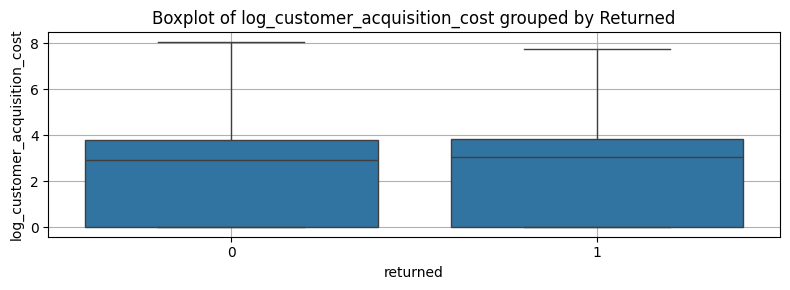

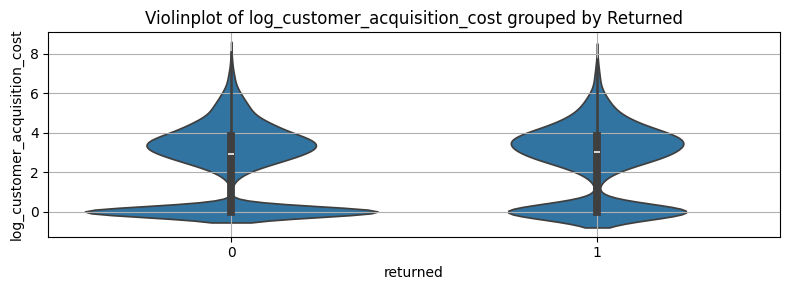

Avarage meaning:
 returned                                  0             1
customer_id                     9990.214421  10188.187299
order_id                       10046.574714  10579.923148
customer_age                      43.603211     43.000920
days_between_orders              153.930008    151.974689
price                            307.558937    314.855163
discount                          21.370107     21.372729
quantity                          50.633818     50.236539
ad_spend                         238.743861    236.756710
total_revenue                   5065.860571   5144.098021
ROI                               40.010982     45.314271
shipping_cost                    155.038867    154.589884
click_through_rate                 4.198273      4.209701
cost_per_click                     4.026449      3.992204
bounce_rate                       50.122459     50.856493
customer_acquisition_cost         52.183757     48.749655
sales                             50.731197     49.413

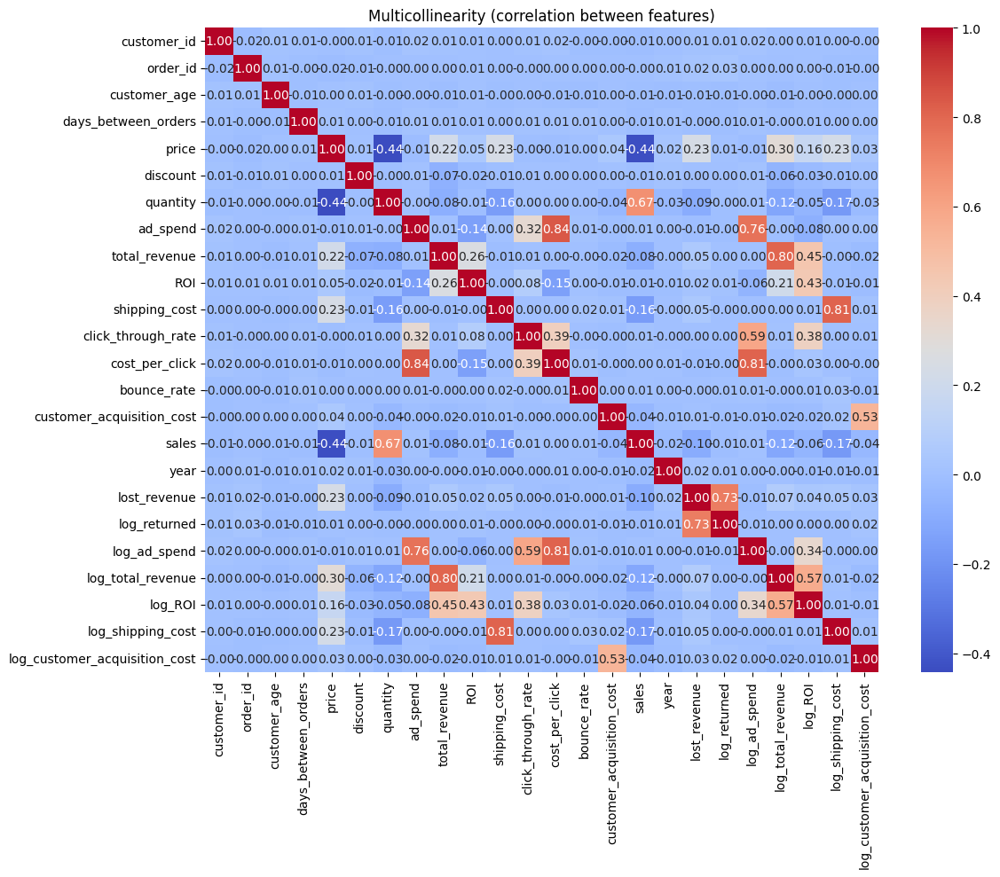

In [26]:
#Explore Data Analisis EDA
# Univariate Analysis
from scipy.stats import skew, kurtosis
numeric_cols = merged_df.select_dtypes(include="number").columns
for col in numeric_cols:
    data = merged_df[col].dropna()
    col_skew = skew(data)
    col_kurt = kurtosis(data)
    print(f"\nFeature: {col}")
    print(f"   • Skewness   = {col_skew:.2f}")
    print(f"   • Kurtosis   = {col_kurt:.2f}")
    # Интерпретация
    if abs(col_skew) < 0.5:
        print("Distribution is approximately symmetric (normal-like).")
    elif col_skew > 0.5:
        print("Distribution is right-skewed (positive skew). May need log or sqrt transform.")
    else:
        print("Distribution is left-skewed (negative skew).")
    # Kurtosis interpretation
    if col_kurt > 3:
        print("Leptokurtic (heavy tails, many outliers).")
    elif col_kurt < 3:
        print("Platykurtic (light tails).")
    else:
        print("Mesokurtic (normal tails).")

    # histogram
    plt.figure(figsize=(10, 4))
    sns.histplot(data, bins=30, kde=True)
    plt.title(f"Histogram + KDE: {col}")
    plt.grid(True)
    plt.show()

    # Boxplot
    plt.figure(figsize=(10, 2))
    sns.boxplot(x=data)
    plt.title(f"Boxplot: {col}")
    plt.grid(True)
    plt.show()

# Logp1
logofeatures = ["returned", "ad_spend", "total_revenue", "ROI", "shipping_cost", "customer_acquisition_cost"]

for col in logofeatures:
    if col in merged_df.columns:
        merged_df["log_" + col] = np.log1p(merged_df[col])

logofeatures = ["returned", "ad_spend", "total_revenue", "ROI", "shipping_cost", "customer_acquisition_cost"]

for col in logofeatures:
    log_col = "log_" + col
    if log_col in merged_df.columns:
        data = merged_df[log_col].dropna()
        col_skew = skew(data)
        col_kurt = kurtosis(data)

        print(f"\nFeature: {log_col}")
        print(f"   • Skewness   = {col_skew:.2f}")
        print(f"   • Kurtosis   = {col_kurt:.2f}")

        if abs(col_skew) < 0.5:
            print("Distribution is approximately symmetric (normal-like).")
        elif col_skew > 0.5:
            print("Distribution is right-skewed (positive skew).")
        else:
            print("   ⚠️ Distribution is left-skewed (negative skew).")

        if col_kurt > 3:
            print("Leptokurtic (heavy tails, many outliers).")
        elif col_kurt < 3:
            print("Platykurtic (light tails).")
        else:
            print("Mesokurtic (normal tails).")

        # Histogram
        plt.figure(figsize=(8, 3))
        sns.histplot(data, bins=30, kde=True, color="lightblue")
        plt.title(f"Histogram (Log): {log_col}")
        plt.grid(True)
        plt.show()

        # Boxplot
        plt.figure(figsize=(8, 1.8))
        sns.boxplot(x=data, color="lightgreen")
        plt.title(f"Boxplot (Log): {log_col}")
        plt.grid(True)
        plt.show()

# Define the target variable (e.g."returned")
target = "returned"
cat_cols = [
    col for col in merged_df.select_dtypes(include='object').columns
    if merged_df[col].nunique() < 20 and col != target
]

for col in cat_cols:
    print(f"\n📊 Value Counts for {col}:\n", merged_df[col].value_counts())

    plt.figure(figsize=(7, 3))
    sns.countplot(data=merged_df, x=col)
    plt.title(f"Countplot: {col}")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

for col in cat_cols:
    plt.figure(figsize=(7, 3))
    sns.barplot(data=merged_df, x=col, y=target, estimator=np.mean)
    plt.title(f"Average {target} by {col}")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

for col in cat_cols:
    plt.figure(figsize=(7, 3))
    sns.boxplot(data=merged_df, x=col, y=target)
    plt.title(f"Boxplot: {target} by {col}")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(7, 3))
    sns.violinplot(data=merged_df, x=col, y=target)
    plt.title(f"Violinplot: {target} by {col}")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.grid(True)
    plt.show()



#Bivariate Analysis
target = "returned"
cat_cols = [
    col for col in merged_df.select_dtypes(include='object').columns
    if merged_df[col].nunique() < 20 and col != target
]
num_cols = [
    col for col in merged_df.select_dtypes(include='number').columns
    if col != target
]
for col in num_cols:
    plt.figure(figsize=(10, 4))
    sns.violinplot(data=merged_df, x=target, y=col)
    plt.title(f"🎻 Violin Plot: {col} vs {target}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
for col in num_cols:
    plt.figure(figsize=(10, 4))
    sns.boxplot(data=merged_df, x=target, y=col)
    plt.title(f"Boxplot: {col} vs {target}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for col in cat_cols:
    plt.figure(figsize=(8, 4))
    sns.barplot(data=merged_df, x=col, y="returned", estimator=np.mean)
    plt.title(f"Average Return Rate by {col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for col in cat_cols:
    print(f"\n Value Counts for {col}:\n")
    print(merged_df[col].value_counts())

# corr
corr_matrix = merged_df.corr(numeric_only=True)
print(corr_matrix["returned"].sort_values(ascending=False))
plt.figure(figsize=(20, 15), dpi=200)
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("🔍 Correlation Heatmap (Numeric Features)")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Multivariate Analysis
#Pair plot
selected_numeric = ["ad_spend", "ROI", "shipping_cost", "price", "total_revenue", "customer_acquisition_cost"]
sns.pairplot(data=merged_df[selected_numeric + ["returned"]], hue="returned", corner=True, diag_kind="kde")
plt.suptitle("Pairplot of Numeric Features Colored by 'Returned'", y=1.02)
plt.show()

# Catplot
selected_cats = ["customer_country", "payment_method", "loyalty_segment","sales_channel"]
target = "returned"
for col in selected_cats:
    g = sns.catplot(data=merged_df, x=col, hue=target, kind="count", height=4, aspect=1.2)
    g.fig.suptitle(f"Категория {col} и возвраты", y=1.05)
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

# Target Variable Analysis
#  Distribution of the target variable
merged_df.groupby("returned")[num_cols].mean()
#Comparison of average values ​​of numerical features
plt.figure(figsize=(6, 4))
sns.countplot(data=merged_df, x="returned", palette="Set2")
plt.title("Distribution of Returned Orders (Target Variable)")
plt.xlabel("Returned (0 = No, 1 = Yes)")
plt.ylabel("Number of Orders")
plt.grid(True)
plt.tight_layout()
plt.show()

# Boxplot and Violinplot for each numerical feature
for col in num_cols:
    plt.figure(figsize=(8, 3))
    sns.boxplot(data=merged_df, x="returned", y=col)
    plt.title(f"Boxplot of {col} grouped by Returned")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 3))
    sns.violinplot(data=merged_df, x="returned", y=col)
    plt.title(f"Violinplot of {col} grouped by Returned")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# Feature Comparison & Selection
#1. Comparison of mean and median values ​​for returned (target variable)
mean_comparison = merged_df.groupby("returned")[num_cols].mean().T
median_comparison = merged_df.groupby("returned")[num_cols].median().T
print("Avarage meaning:\n", mean_comparison)
print("\Median meaning:\n", median_comparison)

#2. Checking the dispersion (scattering of values):
variance = merged_df[num_cols].var().sort_values(ascending=False)
print("Variance meaning:\n", variance)

# Check for multicollinearity (correlation between features):
corr = merged_df[num_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Multicollinearity (correlation between features)")
plt.tight_layout()
plt.show()

# Diagnostic Analytics

In this stage, we investigate why certain returns occur using statistical hypothesis testing.
This helps identify which variables meaningfully affect the likelihood of returns.
We applied the following tests:
T-tests — to compare mean values (e.g., price, customer_age) between returned and non-returned orders.
Mann-Whitney U test — for comparing distributions of non-normally distributed features.
ANOVA (f_oneway) — to test if return rates differ significantly across groups like customer_country.
Kruskal-Wallis test — non-parametric alternative to ANOVA for non-normal data.
Pearson correlation — to measure linear relationships between numeric features and returns.
Spearman correlation — to assess monotonic relationships in non-normal distributions.
Chi-square test — to evaluate associations between categorical features (e.g., payment_method, loyalty_segment) and the binary target returned.
Post-hoc Tukey HSD test — to perform pairwise comparisons after ANOVA and identify which groups differ significantly.

In [34]:

from scipy.stats import ttest_ind

# Split the dataset into two groups based on the target variable 'returned'
returned_0 = merged_df[merged_df["returned"] == 0]["price"]
returned_1 = merged_df[merged_df["returned"] == 1]["price"]
t_stat, p_value = ttest_ind(returned_0, returned_1, equal_var=False)
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_value:.4f}")
if p_value < 0.05:
    print("The difference in average 'price' between returned and non-returned orders is statistically significant.")
else:
    print("The difference in average 'price' is not statistically significant — 'price' may not influence returns.")


#Does age affect returns?  ttest_ind
customer_id_returned_0 = merged_df[merged_df["returned"]==0]["customer_age"]
customer_id_returned_1 = merged_df[merged_df["returned"]==1]["customer_age"]
t_stat, p_value = ttest_ind(customer_id_returned_0, customer_id_returned_1, equal_var=False)
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_value:.4f}")
if p_value < 0.05:
    print("The difference in average 'customer_age' between returned and non-returned orders is statistically significant.")
else:
    print("The difference in average 'customer_age' is not statistically significant — 'customer_age' may not influence returns.")

  # Test mannwhitneyu for non-normal distribution
from scipy.stats import mannwhitneyu
group_0 = merged_df[merged_df["returned"] == 0]["price"]
group_1 = merged_df[merged_df["returned"] == 1]["price"]
stat, p = mannwhitneyu(group_0, group_1, alternative='two-sided')
print(f"Mann-Whitney U Statistic: {stat:.3f}")
print(f"P-value: {p:.4f}")
if p < 0.05:
    print("Statistically significant difference in price between returned and non-returned.")
else:
    print("No statistically significant difference in price.")




# ANOVA test We want to test whether the return rates ('returned') significantly differ across customer countries.
from scipy.stats import f_oneway
# Split target variable (returned) by country
NI = merged_df[merged_df["customer_country"] == "Northern Ireland"]["returned"]
England = merged_df[merged_df["customer_country"] == "England"]["returned"]
Scotland = merged_df[merged_df["customer_country"] == "Scotland"]["returned"]
Wales = merged_df[merged_df["customer_country"] == "Wales"]["returned"]
# Apply ANOVA test (comparing means of 3+ groups)
f_stat, p_value = f_oneway(NI, England, Scotland, Wales)
print(f"F-Statistic: {f_stat:.3f}")
print(f"P-Value: {p_value:.4f}")
if p_value < 0.05:
    print("Statistically significant difference — return rates vary across countries.")
else:
    print("No significant difference — return rates are similar across countries.")

# Test Kruskal for non-normal distribution
from scipy.stats import kruskal
eng = merged_df[merged_df["customer_country"] == "England"]["returned"]
sco = merged_df[merged_df["customer_country"] == "Scotland"]["returned"]
wal = merged_df[merged_df["customer_country"] == "Wales"]["returned"]
ni = merged_df[merged_df["customer_country"] == "Northern Ireland"]["returned"]
stat, p = kruskal(eng, sco, wal, ni)
print(f"Kruskal-Wallis Statistic: {stat:.3f}")
print(f"P-value: {p:.4f}")
if p < 0.05:
    print("Significant difference in returns between countries.")
else:
    print("No significant difference in returns between countries.")


# Test pearsonr for normal distribution
from scipy.stats import pearsonr
for col in num_cols:
    corr, p = pearsonr(merged_df[col], merged_df["returned"])
    print(f"{col}: Pearson r = {corr:.3f}, p-value = {p:.4f}")
    if p < 0.05:
        print(" ✅ Statistically significant relationship")
    else:
        print(" ❌ Not significant")

# Test spearmanr for non normal  distribution
from scipy.stats import spearmanr
for col in num_cols:
    coef, p_value = spearmanr(merged_df["returned"], merged_df[col])
    print(f"{col:35} → Spearman ρ = {coef:.3f} | p-value = {p_value:.4f}")

    if p_value < 0.05:
        print("   ✅ Statistically significant correlation (include for consideration)")
    else:
        print("   ⚠️ Not statistically significant (likely weak or noisy)")
    print()

# Chi-square test to check whether the payment method is related to product returns
from scipy.stats import chi2_contingency

cat_cols = [
    col for col in merged_df.select_dtypes(include='object').columns
    if merged_df[col].nunique() < 20 and col != "returned"
]

for col in cat_cols:
    contingency_table = pd.crosstab(merged_df[col], merged_df["returned"])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

    print(f"\nColumn: {col}")
    print(f"Chi2 Statistic: {chi2_stat:.3f}")
    print(f"P-Value: {p_value:.4f}")

    if p_value < 0.05:
        print("✅ Significant relationship with target (keep this feature)")
    else:
        print("⚠️ No significant relationship (could consider dropping)")
else:
    print("No significant relationship found.")


from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey = pairwise_tukeyhsd(
    endog=merged_df["returned"],
    groups=merged_df["loyalty_segment"],
    alpha=0.05
)
print(tukey)


tukey_payment_method = pairwise_tukeyhsd(
    endog=merged_df["returned"],
    groups=merged_df["payment_method"],
    alpha=0.05
)
print(tukey_payment_method)


tukey_category = pairwise_tukeyhsd(
    endog=merged_df["returned"],
    groups=merged_df["category"],
    alpha=0.05
)
print(tukey_category)

T-statistic: -1.170
P-value: 0.2421
The difference in average 'price' is not statistically significant — 'price' may not influence returns.
T-statistic: 1.770
P-value: 0.0769
The difference in average 'customer_age' is not statistically significant — 'customer_age' may not influence returns.
Mann-Whitney U Statistic: 19352851.000
P-value: 0.4211
No statistically significant difference in price.
F-Statistic: 0.437
P-Value: 0.7268
No significant difference — return rates are similar across countries.
Kruskal-Wallis Statistic: 1.310
P-value: 0.7268
No significant difference in returns between countries.
customer_id: Pearson r = 0.011, p-value = 0.1312
 ❌ Not significant
order_id: Pearson r = 0.028, p-value = 0.0001
 ✅ Statistically significant relationship
customer_age: Pearson r = -0.012, p-value = 0.0763
 ❌ Not significant
days_between_orders: Pearson r = -0.006, p-value = 0.4218
 ❌ Not significant
price: Pearson r = 0.008, p-value = 0.2326
 ❌ Not significant
discount: Pearson r = 0.000

# Feature Engineering


Based on the results of statistical tests from the diagnostic analytics stage, we selected the most relevant variables that showed meaningful relationships with the target (returned). These features include:
Financial metrics (lost_revenue, total_revenue, price, ROI)
Customer behavior (bounce_rate, customer_age, log_customer_acquisition_cost)
Categorical return reasons (return_reason, one-hot encoded)
These variables were transformed and prepared into a machine learning–ready format. We then split the dataset into training and test sets to develop and evaluate classification models that predict whether a product will be returned.

In [60]:
# Feature Engineering
features_df = merged_df[
    [
        'log_customer_acquisition_cost',
        'ROI',
        'price',
        'bounce_rate',
        'total_revenue',
        'customer_age',
        'return_reason',
        'returned'
    ]
].copy()
features_df = pd.get_dummies(features_df, columns=['return_reason'], drop_first=True)
X = features_df.drop('returned', axis=1)
y = features_df['returned']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102, stratify=y)

# Predictive Analytics — Return Classification

At this stage, we build and evaluate machine learning models to solve a binary classification problem — predicting whether a product will be returned (returned: 1 or 0).
To address class imbalance (since returns are relatively rare), we use SMOTE (Synthetic Minority Over-sampling Technique), which generates synthetic samples for the minority class. This helps the models learn from rare events and reduces bias toward the majority class.
We trained and compared several models:
Bagging Classifier with DecisionTreeClassifier as the base estimator
Random Forest with GridSearchCV to tune hyperparameters
XGBoost, also optimized with GridSearchCV (depth, learning rate, estimators, etc.)
All models are wrapped in a pipeline that includes SMOTE, and evaluated using cross-validation (CV=5).
Performance is measured using metrics such as Accuracy, Precision, Recall, F1-score, and Confusion Matrix.
The final model (XGBoost) was retrained on the full dataset and saved for future use.

# DecisionTreeClassifier

Train Accuracy: 0.9960346964064436
Test Accuracy: 0.9962825278810409
Train Precision: 0.996052239571796
Test Precision: 0.9962979530765552
Train Recall: 0.9960346964064436
Test Recall: 0.9962825278810409
Train F1 Score: 0.9960019026727873
Test F1 Score: 0.9962537827926207


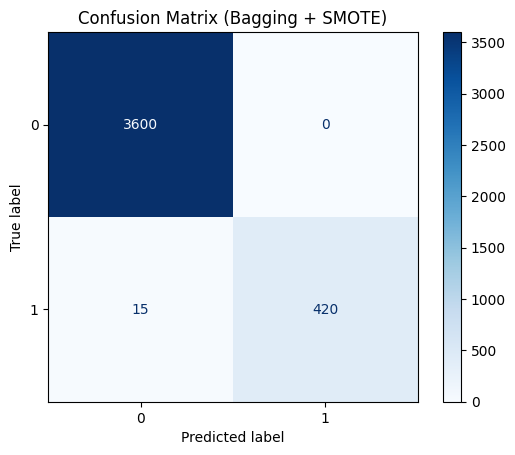

In [62]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix, ConfusionMatrixDisplay
)
bagging_pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('model', BaggingClassifier(
        estimator=DecisionTreeClassifier(max_depth=5, random_state=42),
        n_estimators=100,
        max_samples=0.8,
        max_features=3,
        bootstrap=True,
        random_state=42,
        n_jobs=-1,
    ))
])

bagging_pipeline.fit(X_train, y_train)
train_predict = bagging_pipeline.predict(X_train)
test_predict = bagging_pipeline.predict(X_test)

print("Train Accuracy:", accuracy_score(y_train, train_predict))
print("Test Accuracy:", accuracy_score(y_test, test_predict))
print("Train Precision:", precision_score(y_train, train_predict, average='weighted'))
print("Test Precision:", precision_score(y_test, test_predict, average='weighted'))
print("Train Recall:", recall_score(y_train, train_predict, average='weighted'))
print("Test Recall:", recall_score(y_test, test_predict, average='weighted'))
print("Train F1 Score:", f1_score(y_train, train_predict, average='weighted'))
print("Test F1 Score:", f1_score(y_test, test_predict, average='weighted'))

cm = confusion_matrix(y_test, test_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix (Bagging + SMOTE)")
plt.show()



# Random Forest Classification with SMOTE

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best Params: {'model__max_depth': 5, 'model__max_features': 'sqrt', 'model__min_samples_split': 2, 'model__n_estimators': 100}
Accuracy: 0.9987608426270136
Precision: 0.998762561291886
Recall: 0.9987608426270136
F1 Score: 0.9987576912117133


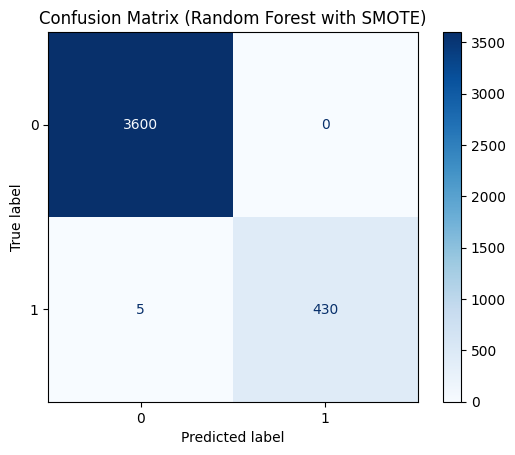

[[0.04619566 0.95380434]
 [0.96899926 0.03100074]
 [0.98491083 0.01508917]
 [0.98641031 0.01358969]
 [0.98287372 0.01712628]]


In [64]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('model', RandomForestClassifier(random_state=42, n_jobs=-1))
])

param_grid = {
    'model__n_estimators': [100, 200],
    'model__max_depth': [5, 10, 15],
    'model__max_features': ['sqrt', 'log2'],
    'model__min_samples_split': [2, 5],
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='f1_weighted',
    cv=5,
    n_jobs=-1,
    verbose=2
)

grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
test_predict = best_model.predict(X_test)

accuracy = accuracy_score(y_test, test_predict)
precision = precision_score(y_test, test_predict, average='weighted')
recall = recall_score(y_test, test_predict, average='weighted')
f1 = f1_score(y_test, test_predict, average='weighted')

print("Best Params:", grid_search.best_params_)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

cm = confusion_matrix(y_test, test_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix (Random Forest with SMOTE)")
plt.show()

proba = best_model.predict_proba(X_test)
print(proba[:5])


# SMOTE + XGBoost

Fitting 5 folds for each of 24 candidates, totalling 120 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:35:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Params: {'model__learning_rate': 0.05, 'model__max_depth': 3, 'model__n_estimators': 100, 'model__subsample': 0.8}
Accuracy: 0.9988
Precision: 0.9988
Recall: 0.9988
F1 Score: 0.9988


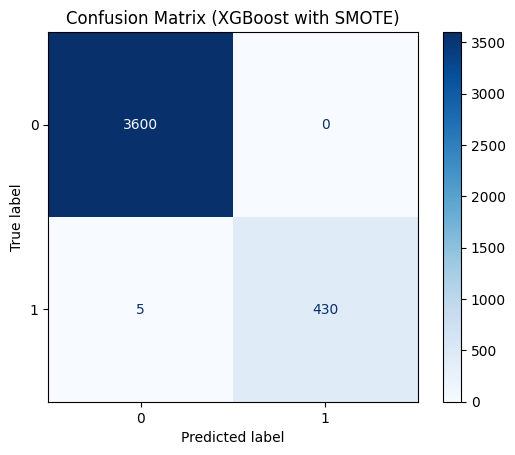

In [61]:
# XGBoost Model: Pipeline with SMOTE + GridSearchCV for tuning
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('model', XGBClassifier(
        objective='binary:logistic',
        use_label_encoder=False,
        eval_metric='logloss',
        n_jobs=-1,
        random_state=42
    ))
])

param_grid = {
    'model__n_estimators': [100, 200],
    'model__max_depth': [3, 5, 7],
    'model__learning_rate': [0.05, 0.1],
    'model__subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='f1_weighted',
    cv=5,
    n_jobs=-1,
    verbose=2
)

grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
test_predict = best_model.predict(X_test)
test_proba = best_model.predict_proba(X_test)[:, 1]

accuracy = accuracy_score(y_test, test_predict)
precision = precision_score(y_test, test_predict, average='weighted')
recall = recall_score(y_test, test_predict, average='weighted')
f1 = f1_score(y_test, test_predict, average='weighted')

print(f"Best Params: {grid_search.best_params_}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_test, test_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix (XGBoost with SMOTE)")
plt.show()


# Model Evaluation and Interpretability

In this section, we evaluate the performance of the final classification model and interpret its behavior.

ROC Curve & AUC Score:
We plot the ROC curve and calculate the AUC (Area Under the Curve) to assess how well the model distinguishes between the return classes (0 = not returned, 1 = returned). AUC close to 1 indicates excellent classification performance.

Feature Importance:
Using the feature_importances_ attribute of the XGBoost model, we analyze which features contributed the most to the predictions. This helps us understand which return reasons or customer-related factors were most influential.

Class Distribution:
We also inspect the distribution of the target variable in the training set to ensure class imbalance is properly handled.

This interpretability step is important for both model validation and business understanding, especially when deploying in real-world scenarios.

returned
0    14402
1     1738
Name: count, dtype: int64
log_customer_acquisition_cost: 0.0131
ROI: 0.0010
price: 0.0001
bounce_rate: 0.0027
total_revenue: 0.0001
customer_age: 0.0002
return_reason_Poor Quality: 0.0267
return_reason_Wrong Item: 0.0419
return_reason_damaged: 0.1471
return_reason_no_return: 0.5681
return_reason_too_expensive: 0.1989


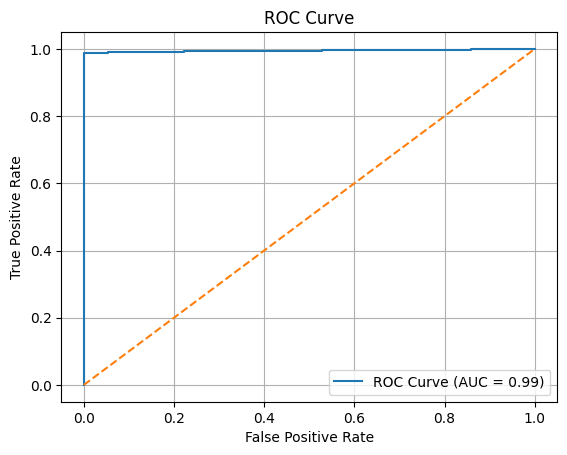

In [66]:
from sklearn.metrics import roc_curve, auc

print(y_train.value_counts())


importances = best_model.named_steps['model'].feature_importances_
for feat, imp in zip(X.columns, importances):
    print(f"{feat}: {imp:.4f}")


fpr, tpr, _ = roc_curve(y_test, proba[:,1])
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()


#  Final (retraining)

In the Final (retraining) section, the model is retrained on the entire available dataset (including both training and test sets).

In [67]:
#final (retraining)
final_pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('model', XGBClassifier(
        objective='binary:logistic',
        eval_metric='logloss',
        learning_rate=0.1,
        max_depth=5,
        n_estimators=100,
        subsample=0.8,
        random_state=42,
        n_jobs=-1
    ))
])

final_pipeline.fit(X, y)

Pipeline(steps=[('smote', SMOTE(random_state=42)),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=-1,
                               num_parallel_tree=None, random_state=42, ...))])

# Model Deployment and Export

In this final step, the trained XGBoost classification model is saved to disk using joblib, allowing it to be reused later for predictions without retraining. After that, predictions are made on the full dataset, and the results are exported to an Excel file for further use in reporting, visualization, or integration with other systems (e.g., Power BI or business dashboards).

This marks the completion of the predictive pipeline, making the model ready for production, stakeholder presentation, or real-world decision support.

In [68]:
import joblib
joblib.dump(final_pipeline, 'best_model_xgboost.pkl')

y_pred = final_pipeline.predict(X)

features_df['prediction'] = y_pred
features_df.to_excel('classified_data.xlsx', index=False)

